In [ ]:
!pip install -q tensorflow-probability

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_probability as tfp
import tensorflow as tf
import pandas as pd
import cv2, os

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d lakshaymiddha/crack-segmentation-dataset

rm: cannot remove '/root/.kaggle': No such file or directory
 99% 1.97G/1.98G [00:28<00:00, 124MB/s]
100% 1.98G/1.98G [00:28<00:00, 73.4MB/s]


In [ ]:
!mv "/content/crack-segmentation-dataset.zip" "/content/drive/MyDrive/Crack Segmentation"

In [ ]:
import zipfile
with zipfile.ZipFile("/content/drive/MyDrive/Crack Segmentation/crack-segmentation-dataset.zip","r") as zip_ref:
    zip_ref.extractall("/content/drive/MyDrive/Crack Analysis Project")

In [ ]:
print(len(os.listdir('/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/train/images')))
print(len(os.listdir('/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/test/images')))

9603
1695


# Data Storing in Arrays

In [ ]:
IMG, MSK = [], []
k=0
for img, msk in zip(sorted(os.listdir('/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/train/images'))[:5000],
                              sorted(os.listdir('/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/train/masks'))[:5000]):
  image = cv2.imread(f'/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/train/images/{img}')
  image = cv2.resize(image, (128, 128))
  mask = cv2.imread(f'/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/train/masks/{msk}')
  mask = cv2.resize(mask, (128, 128))
  IMG.append(image)
  MSK.append(mask)
  k+=1
  print(k)
train_image = np.array([ i for i in IMG]).reshape((5000, 128, 128, 3))
train_mask = np.array([ i for i in MSK]).reshape((5000, 128, 128, 3))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [ ]:
np.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TRAIN_Images.npy', train_image)
np.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TRAIN_Masks.npy', train_mask)

In [ ]:
IMG, MSK = [], []
k=0
for img, msk in zip(sorted(os.listdir('/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/test/images')),
                              sorted(os.listdir('/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/test/masks'))):
  image = cv2.imread(f'/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/test/images/{img}')
  image = cv2.resize(image, (128, 128))
  mask = cv2.imread(f'/content/drive/MyDrive/Crack Analysis Project/crack_segmentation_dataset/test/masks/{msk}')
  mask = cv2.resize(mask, (128, 128))
  IMG.append(image)
  MSK.append(mask)
  k+=1
  print(k)
test_image = np.array([ i for i in IMG]).reshape((1695, 128, 128, 3))
test_mask = np.array([ i for i in MSK]).reshape((1695, 128, 128, 3))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [ ]:
np.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TEST_Images.npy', test_image)
np.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TEST_Masks.npy', test_mask)

## **Data** Loading

In [ ]:
train_image = np.load('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TRAIN_Images.npy')/255.0
test_image = np.load('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TEST_Images.npy')/255.0
train_mask = np.load('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TRAIN_Masks.npy')/255.0
test_mask = np.load('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/TEST_Masks.npy')/255.0
data_variance = np.var(train_image)
print(data_variance)

0.023600886318277677


In [ ]:
print(train_image.max())
print(train_image.min())
print(train_image.mean())

1.0
0.0
0.4907030599117919


In [ ]:
print(train_mask.max())
print(train_mask.min())
print(train_mask.mean())

1.0
0.0
0.0459766989315258


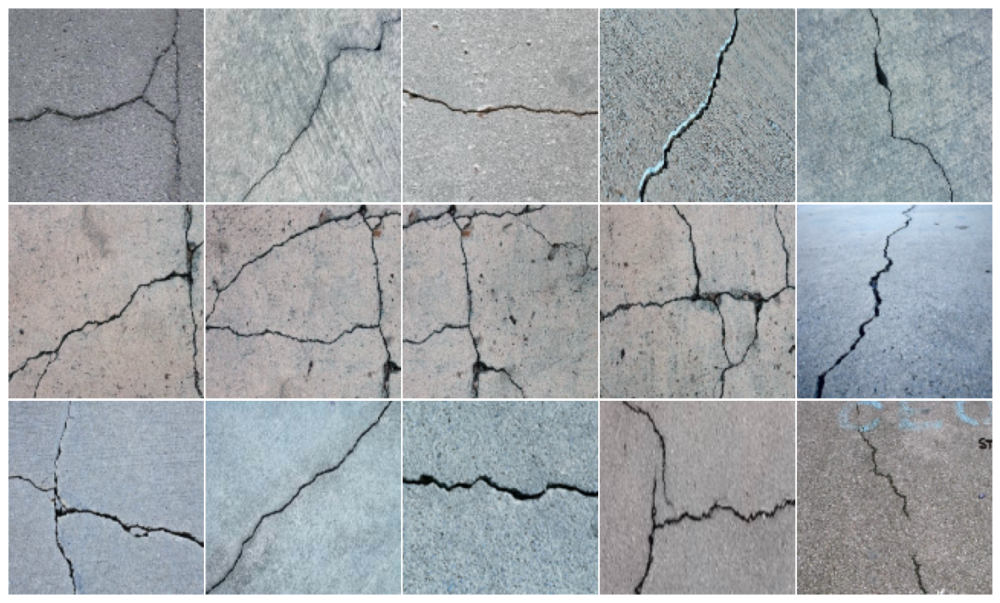

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = (15, 9)
sns.set_style("whitegrid", {'axes.grid': False})

# Assuming test_image contains your images
for i, image in enumerate(train_image[2985:3000]):
    plt.subplot(3, 5, i + 1)
    plt.axis("off")
    plt.imshow(image, aspect='auto')

plt.subplots_adjust(hspace=0.01, wspace=0.01)
plt.show()

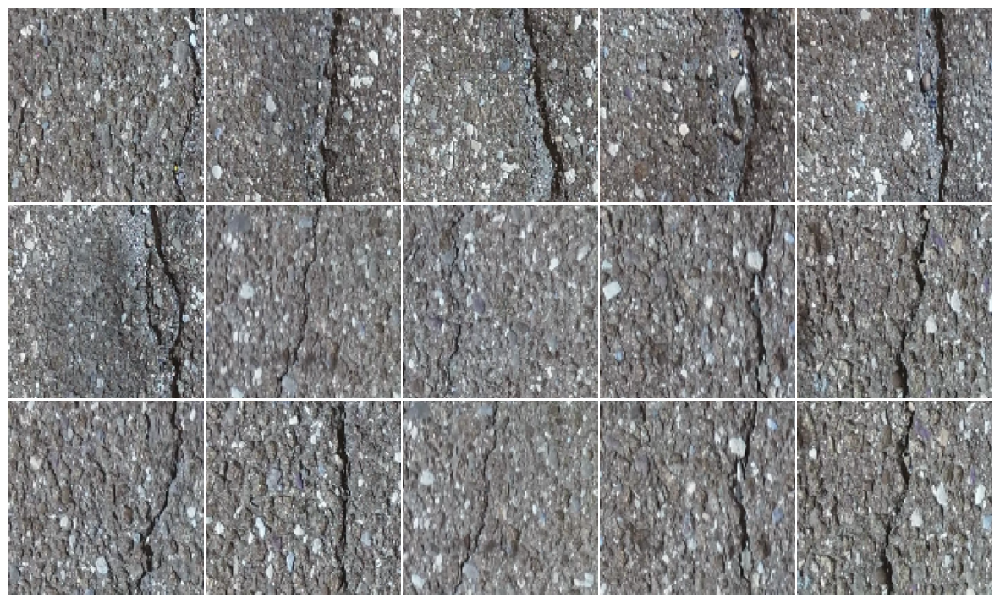

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = (15, 9)
sns.set_style("whitegrid", {'axes.grid': False})

# Assuming test_image contains your images
for i, image in enumerate(train_image[980:995]):
    plt.subplot(3, 5, i + 1)
    plt.axis("off")
    plt.imshow(image, aspect='auto')

plt.subplots_adjust(hspace=0.01, wspace=0.01)
plt.show()

# **Binary Crossentropy**

In [ ]:
class VectorQuantizer(layers.Layer):
    def __init__(self, num_embeddings, embedding_dim, beta=0.25, **kwargs):
        super().__init__(**kwargs)
        self.embedding_dim = embedding_dim
        self.num_embeddings = num_embeddings
        # The `beta` parameter is best kept between [0.25, 2] as per the paper.
        self.beta = beta
        # Initialize the embeddings which we will quantize.
        w_init = tf.random_uniform_initializer()
        self.embeddings = tf.Variable(
            initial_value=w_init(shape=(self.embedding_dim, self.num_embeddings), dtype="float32"), trainable=True, name="embeddings_vqvae")
    def call(self, x):
        input_shape = tf.shape(x)
        flattened = tf.reshape(x, [-1, self.embedding_dim])
        # Quantization.
        encoding_indices = self.get_code_indices(flattened)
        encodings = tf.one_hot(encoding_indices, self.num_embeddings)
        quantized = tf.matmul(encodings, self.embeddings, transpose_b=True)
        # Reshape the quantized values back to the original input shape
        quantized = tf.reshape(quantized, input_shape)
        commitment_loss = tf.reduce_mean((tf.stop_gradient(quantized) - x) ** 2)
        codebook_loss = tf.reduce_mean((quantized - tf.stop_gradient(x)) ** 2)
        self.add_loss(self.beta * commitment_loss + codebook_loss)
        # Straight-through estimator.
        quantized = x + tf.stop_gradient(quantized - x)
        return quantized

    def get_code_indices(self, flattened_inputs):
        # Calculate L2-normalized distance between the inputs and the codes.
        similarity = tf.matmul(flattened_inputs, self.embeddings)
        distances = (tf.reduce_sum(flattened_inputs ** 2, axis=1, keepdims=True)+ tf.reduce_sum(self.embeddings ** 2, axis=0)- 2 * similarity)
        # Derive the indices for minimum distances.
        encoding_indices = tf.argmin(distances, axis=1)
        return encoding_indices

In [ ]:
def get_encoder(latent_dim=16):
    encoder_inputs = keras.Input(shape=(128, 128, 3))
    x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(
        encoder_inputs
    )
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    encoder_outputs = layers.Conv2D(latent_dim, 1, padding="same")(x)
    return keras.Model(encoder_inputs, encoder_outputs, name="encoder")


def get_decoder(latent_dim=16):
    latent_inputs = keras.Input(shape=get_encoder(latent_dim).output.shape[1:])
    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(
        latent_inputs
    )
    x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    decoder_outputs = layers.Conv2DTranspose(3, 3, padding="same", activation='sigmoid')(x)
    return keras.Model(latent_inputs, decoder_outputs, name="decoder")

In [ ]:
get_encoder().summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 32)        896       
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        18496     
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 16)        1040      
                                                                 
Total params: 20432 (79.81 KB)
Trainable params: 20432 (79.81 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
get_decoder().summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 32, 32, 16)]      0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 64, 64, 64)        9280      
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 128, 128, 32)      18464     
 Transpose)                                                      
                                                                 
 conv2d_transpose_2 (Conv2D  (None, 128, 128, 3)       867       
 Transpose)                                                      
                                                                 
Total params: 28611 (111.76 KB)
Trainable params: 28611 (111.76 KB)
Non-trainable params: 0 (0.00 Byte)
_____________________

In [ ]:
Data_Augmentation = keras.models.Sequential([
    keras.layers.RandomFlip(mode="horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(factor = (-0.2, 0.3), fill_mode="reflect", interpolation="bilinear")])

In [ ]:
def get_vqvae(latent_dim=16, num_embeddings=256):
    vq_layer = VectorQuantizer(num_embeddings, latent_dim, name="vector_quantizer")
    encoder = get_encoder(latent_dim)
    decoder = get_decoder(latent_dim)
    inputs = keras.Input(shape=(128, 128, 3))
    Augmented_inputs = Data_Augmentation(inputs)
    encoder_outputs = encoder(Augmented_inputs)
    quantized_latents = vq_layer(encoder_outputs)
    reconstructions = decoder(quantized_latents)
    return keras.Model(inputs, reconstructions, name="vq_vae")
get_vqvae().summary()

Model: "vq_vae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 encoder (Functional)        (None, 32, 32, 16)        20432     
                                                                 
 vector_quantizer (VectorQu  (None, 32, 32, 16)        4096      
 antizer)                                                        
                                                                 
 decoder (Functional)        (None, 128, 128, 3)       28611     
                                                                 
Total params: 53139 (207.57 KB)
Trainable params: 53139 (207.57 KB)
Non-trainable params: 0 (0.00 Byte)
______________________

In [ ]:
from keras import backend as K
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model

smooth = 1.
def dice_score(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

LOG = keras.callbacks.CSVLogger('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/Crack_Segment_VQVAE.csv', separator=",", append=False)

def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
import keras.backend as K

def pixel_wise_accuracy(y_true, y_pred):
    return K.mean(K.equal(K.round(y_true), K.round(y_pred)))

def mean_pixel_accuracy(y_true, y_pred):
    class_accuracy = K.mean(K.cast(K.equal(K.round(y_true), K.round(y_pred)), dtype='float32'), axis=0)
    return K.mean(class_accuracy)

def matthews_correlation_coefficient(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    numerator = intersection
    denominator = K.sqrt(K.sum(y_true) * K.sum(y_pred))
    return K.cast(numerator / denominator, dtype='float32')

def intersection_over_union(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1) - intersection
    iou = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(iou, axis=-1)

def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true + y_pred, axis=-1) - intersection
    jaccard = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(jaccard, axis=-1)


In [ ]:
import tensorflow as tf

def dice_loss(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1-((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))

# Custom Focal Loss function
def focal_loss(y_true, y_pred, alpha=0.25, gamma=2.0):
    # Compute binary cross-entropy loss for each channel
    binary_ce = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=True)
    # Modify the loss for each channel
    focal_loss = alpha * (1 - tf.exp(-binary_ce)) ** gamma * binary_ce
    # Sum the loss across channels
    focal_loss = tf.reduce_sum(focal_loss, axis=-1)
    return tf.reduce_mean(focal_loss)

# Custom Tversky Loss function
def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    true_positives = tf.reduce_sum(y_true * y_pred)
    false_positives = tf.reduce_sum((1 - y_true) * y_pred)
    false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
    tversky = (true_positives + 1e-5) / (true_positives + alpha * false_positives + beta * false_negatives + 1e-5)
    return 1 - tversky

In [ ]:
vqvae_Teacher_trainer = get_vqvae(latent_dim=16, num_embeddings=256)
vqvae_Teacher_trainer.compile(optimizer=keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['accuracy', dice_score,
                                                                                                      mean_pixel_accuracy,
                                                                                                      matthews_correlation_coefficient,
                                                                                                      intersection_over_union,
                                                                                                      jaccard_index,
                                                                                                      keras.metrics.Recall(),
                                                                                                      keras.metrics.Precision(), get_f1])

In [ ]:
Hist = vqvae_Teacher_trainer.fit(train_image, train_mask
                        , epochs=30, batch_size=16, validation_data=(test_image, test_mask), callbacks=[LOG])

In [ ]:
vqvae_Teacher_trainer.evaluate(test_image, test_mask)

In [ ]:
vqvae_Teacher_trainer.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/vqvae_Teacher_1.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = (15, 9)
sns.set_style("whitegrid", {'axes.grid': False})

# Assuming test_image contains your images
for i, image in enumerate(train_image[2985:3000]):
    plt.subplot(3, 5, i + 1)
    plt.axis("off")
    plt.imshow(image, aspect='auto')

plt.subplots_adjust(hspace=0.01, wspace=0.01)
plt.show()

In [ ]:
def show_subplot(original, reconstructed):
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed.squeeze() + 0.5)
    plt.title("Reconstructed")
    plt.axis("off")

    plt.show()

trained_vqvae_model = vqvae_Teacher_trainer
idx = np.random.choice(len(test_image), 10)
test_images = test_image[idx]
reconstructions_test = trained_vqvae_model.predict(test_image)

for test_image, reconstructed_image in zip(test_image, reconstructions_test):
    show_subplot(test_image, reconstructed_image)

1/1 [==============================] - 0s 48ms/step


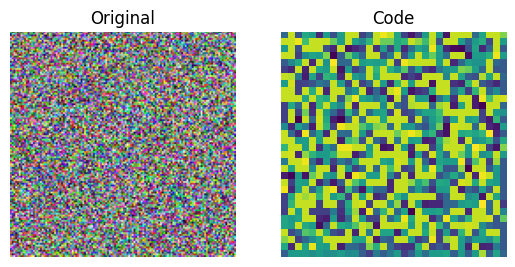

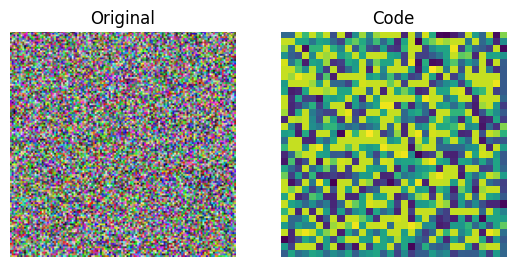

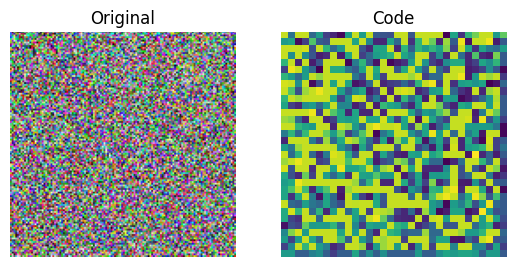

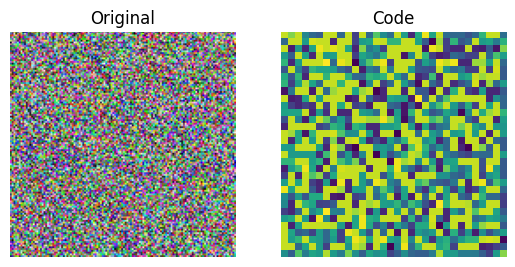

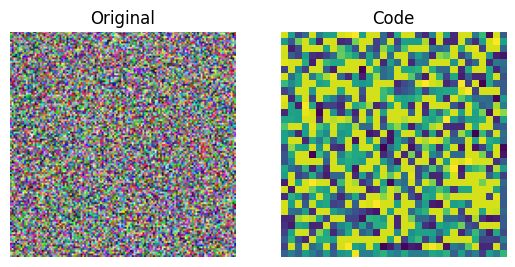

In [ ]:
encoder = vqvae_Teacher_trainer.get_layer("encoder")
quantizer = vqvae_Teacher_trainer.get_layer("vector_quantizer")

encoded_outputs = encoder.predict(test_image)
flat_enc_outputs = encoded_outputs.reshape(-1, encoded_outputs.shape[-1])
codebook_indices = quantizer.get_code_indices(flat_enc_outputs)
codebook_indices = codebook_indices.numpy().reshape(encoded_outputs.shape[:-1])

for i in range(len(test_image[:10])):
    plt.subplot(1, 2, 1)
    plt.imshow(test_image[i])
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(codebook_indices[i])
    plt.title("Code")
    plt.axis("off")
    plt.show()

# **Dice Loss**

In [ ]:
class VectorQuantizer(layers.Layer):
    def __init__(self, num_embeddings, embedding_dim, beta=0.25, **kwargs):
        super().__init__(**kwargs)
        self.embedding_dim = embedding_dim
        self.num_embeddings = num_embeddings
        # The `beta` parameter is best kept between [0.25, 2] as per the paper.
        self.beta = beta
        # Initialize the embeddings which we will quantize.
        w_init = tf.random_uniform_initializer()
        self.embeddings = tf.Variable(
            initial_value=w_init(shape=(self.embedding_dim, self.num_embeddings), dtype="float32"), trainable=True, name="embeddings_vqvae")
    def call(self, x):
        input_shape = tf.shape(x)
        flattened = tf.reshape(x, [-1, self.embedding_dim])
        # Quantization.
        encoding_indices = self.get_code_indices(flattened)
        encodings = tf.one_hot(encoding_indices, self.num_embeddings)
        quantized = tf.matmul(encodings, self.embeddings, transpose_b=True)
        # Reshape the quantized values back to the original input shape
        quantized = tf.reshape(quantized, input_shape)
        commitment_loss = tf.reduce_mean((tf.stop_gradient(quantized) - x) ** 2)
        codebook_loss = tf.reduce_mean((quantized - tf.stop_gradient(x)) ** 2)
        self.add_loss(self.beta * commitment_loss + codebook_loss)
        # Straight-through estimator.
        quantized = x + tf.stop_gradient(quantized - x)
        return quantized

    def get_code_indices(self, flattened_inputs):
        # Calculate L2-normalized distance between the inputs and the codes.
        similarity = tf.matmul(flattened_inputs, self.embeddings)
        distances = (tf.reduce_sum(flattened_inputs ** 2, axis=1, keepdims=True)+ tf.reduce_sum(self.embeddings ** 2, axis=0)- 2 * similarity)
        # Derive the indices for minimum distances.
        encoding_indices = tf.argmin(distances, axis=1)
        return encoding_indices

In [ ]:
def get_encoder(latent_dim=16):
    encoder_inputs = keras.Input(shape=(128, 128, 3))
    x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(
        encoder_inputs
    )
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    encoder_outputs = layers.Conv2D(latent_dim, 1, padding="same")(x)
    return keras.Model(encoder_inputs, encoder_outputs, name="encoder")


def get_decoder(latent_dim=16):
    latent_inputs = keras.Input(shape=get_encoder(latent_dim).output.shape[1:])
    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(
        latent_inputs
    )
    x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    decoder_outputs = layers.Conv2DTranspose(3, 3, padding="same", activation='sigmoid')(x)
    return keras.Model(latent_inputs, decoder_outputs, name="decoder")

In [ ]:
Data_Augmentation = keras.models.Sequential([
    keras.layers.RandomFlip(mode="horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(factor = (-0.2, 0.3), fill_mode="reflect", interpolation="bilinear")])

In [ ]:
def get_vqvae(latent_dim=16, num_embeddings=256):
    vq_layer = VectorQuantizer(num_embeddings, latent_dim, name="vector_quantizer")
    encoder = get_encoder(latent_dim)
    decoder = get_decoder(latent_dim)
    inputs = keras.Input(shape=(128, 128, 3))
    Augmented_inputs = Data_Augmentation(inputs)
    encoder_outputs = encoder(Augmented_inputs)
    quantized_latents = vq_layer(encoder_outputs)
    reconstructions = decoder(quantized_latents)
    return keras.Model(inputs, reconstructions, name="vq_vae")
get_vqvae().summary()

Model: "vq_vae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 encoder (Functional)        (None, 32, 32, 16)        20432     
                                                                 
 vector_quantizer (VectorQu  (None, 32, 32, 16)        4096      
 antizer)                                                        
                                                                 
 decoder (Functional)        (None, 128, 128, 3)       28611     
                                                                 
Total params: 53139 (207.57 KB)
Trainable params: 53139 (207.57 KB)
Non-trainable params: 0 (0.00 Byte)
______________________

In [ ]:
from keras import backend as K
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model

smooth = 1.
def dice_score(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

LOG = keras.callbacks.CSVLogger('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/Crack_Segment_VQVAE.csv', separator=",", append=False)

def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
import keras.backend as K

def pixel_wise_accuracy(y_true, y_pred):
    return K.mean(K.equal(K.round(y_true), K.round(y_pred)))

def mean_pixel_accuracy(y_true, y_pred):
    class_accuracy = K.mean(K.cast(K.equal(K.round(y_true), K.round(y_pred)), dtype='float32'), axis=0)
    return K.mean(class_accuracy)

def matthews_correlation_coefficient(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    numerator = intersection
    denominator = K.sqrt(K.sum(y_true) * K.sum(y_pred))
    return K.cast(numerator / denominator, dtype='float32')

def intersection_over_union(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1) - intersection
    iou = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(iou, axis=-1)

def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true + y_pred, axis=-1) - intersection
    jaccard = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(jaccard, axis=-1)


In [ ]:
import tensorflow as tf

def dice_loss(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1-((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))

# Custom Focal Loss function
def focal_loss(y_true, y_pred, alpha=0.25, gamma=2.0):
    # Compute binary cross-entropy loss for each channel
    binary_ce = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=True)
    # Modify the loss for each channel
    focal_loss = alpha * (1 - tf.exp(-binary_ce)) ** gamma * binary_ce
    # Sum the loss across channels
    focal_loss = tf.reduce_sum(focal_loss, axis=-1)
    return tf.reduce_mean(focal_loss)

# Custom Tversky Loss function
def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    true_positives = tf.reduce_sum(y_true * y_pred)
    false_positives = tf.reduce_sum((1 - y_true) * y_pred)
    false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
    tversky = (true_positives + 1e-5) / (true_positives + alpha * false_positives + beta * false_negatives + 1e-5)
    return 1 - tversky

In [ ]:
vqvae_Teacher_trainer = get_vqvae(latent_dim=16, num_embeddings=256)
vqvae_Teacher_trainer.compile(optimizer=keras.optimizers.Adam(), loss= dice_loss, metrics=[             'accuracy',
                                                                                                      mean_pixel_accuracy,
                                                                                                      matthews_correlation_coefficient,
                                                                                                      intersection_over_union,
                                                                                                      jaccard_index,
                                                                                                      keras.metrics.Recall(),
                                                                                                      keras.metrics.Precision(), get_f1])

In [ ]:
Hist = vqvae_Teacher_trainer.fit(train_image, train_mask
                        , epochs=30, batch_size=16, validation_data=(test_image, test_mask), callbacks=[LOG])

Epoch 1/30
313/313 [==============================] - 29s 45ms/step - loss: 0.9037 - accuracy: 0.5336 - mean_pixel_accuracy: 0.4306 - matthews_correlation_coefficient: 0.1730 - intersection_over_union: 0.0278 - jaccard_index: 0.0278 - recall: 0.6304 - precision: 0.0661 - get_f1: 0.0980 - val_loss: 0.8824 - val_accuracy: 0.3814 - val_mean_pixel_accuracy: 0.7808 - val_matthews_correlation_coefficient: nan - val_intersection_over_union: 0.0205 - val_jaccard_index: 0.0205 - val_recall: 0.5137 - val_precision: 0.1132 - val_get_f1: 0.1190
Epoch 2/30
313/313 [==============================] - 8s 24ms/step - loss: 0.8878 - accuracy: 0.4139 - mean_pixel_accuracy: 0.7229 - matthews_correlation_coefficient: 0.1575 - intersection_over_union: 0.0203 - jaccard_index: 0.0203 - recall: 0.3551 - precision: 0.0815 - get_f1: 0.1127 - val_loss: 0.8739 - val_accuracy: 0.4614 - val_mean_pixel_accuracy: 0.6922 - val_matthews_correlation_coefficient: nan - val_intersection_over_union: 0.0244 - val_jaccard_ind

In [ ]:
vqvae_Teacher_trainer.evaluate(test_image, test_mask)

In [ ]:
vqvae_Teacher_trainer.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/vqvae_Teacher_2_dice.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = (15, 9)
sns.set_style("whitegrid", {'axes.grid': False})

# Assuming test_image contains your images
for i, image in enumerate(train_image[2985:3000]):
    plt.subplot(3, 5, i + 1)
    plt.axis("off")
    plt.imshow(image, aspect='auto')

plt.subplots_adjust(hspace=0.01, wspace=0.01)
plt.show()

In [ ]:
def show_subplot(original, reconstructed):
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed.squeeze() + 0.5)
    plt.title("Reconstructed")
    plt.axis("off")

    plt.show()

trained_vqvae_model = vqvae_Teacher_trainer
idx = np.random.choice(len(test_image), 10)
test_images = test_image[idx]
reconstructions_test = trained_vqvae_model.predict(test_image)

for test_image, reconstructed_image in zip(test_image, reconstructions_test):
    show_subplot(test_image, reconstructed_image)

1/1 [==============================] - 0s 48ms/step


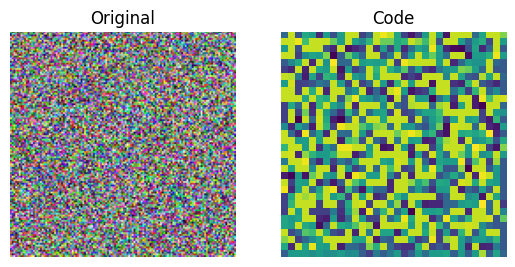

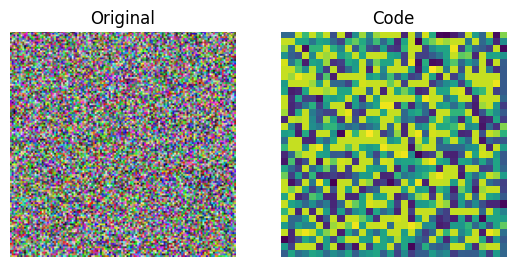

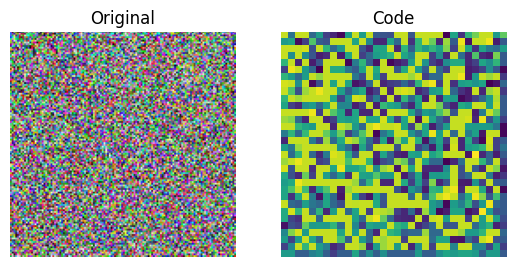

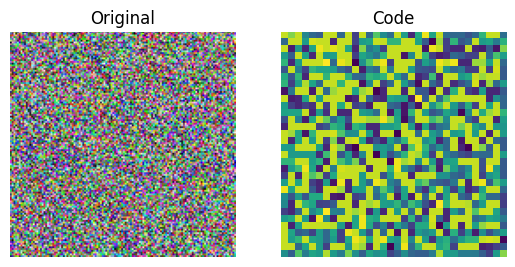

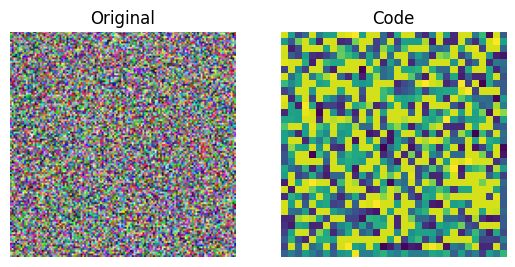

In [ ]:
encoder = vqvae_Teacher_trainer.get_layer("encoder")
quantizer = vqvae_Teacher_trainer.get_layer("vector_quantizer")

encoded_outputs = encoder.predict(test_image)
flat_enc_outputs = encoded_outputs.reshape(-1, encoded_outputs.shape[-1])
codebook_indices = quantizer.get_code_indices(flat_enc_outputs)
codebook_indices = codebook_indices.numpy().reshape(encoded_outputs.shape[:-1])

for i in range(len(test_image[:10])):
    plt.subplot(1, 2, 1)
    plt.imshow(test_image[i])
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(codebook_indices[i])
    plt.title("Code")
    plt.axis("off")
    plt.show()

# **Focal Loss**

In [ ]:
class VectorQuantizer(layers.Layer):
    def __init__(self, num_embeddings, embedding_dim, beta=0.25, **kwargs):
        super().__init__(**kwargs)
        self.embedding_dim = embedding_dim
        self.num_embeddings = num_embeddings
        # The `beta` parameter is best kept between [0.25, 2] as per the paper.
        self.beta = beta
        # Initialize the embeddings which we will quantize.
        w_init = tf.random_uniform_initializer()
        self.embeddings = tf.Variable(
            initial_value=w_init(shape=(self.embedding_dim, self.num_embeddings), dtype="float32"), trainable=True, name="embeddings_vqvae")
    def call(self, x):
        input_shape = tf.shape(x)
        flattened = tf.reshape(x, [-1, self.embedding_dim])
        # Quantization.
        encoding_indices = self.get_code_indices(flattened)
        encodings = tf.one_hot(encoding_indices, self.num_embeddings)
        quantized = tf.matmul(encodings, self.embeddings, transpose_b=True)
        # Reshape the quantized values back to the original input shape
        quantized = tf.reshape(quantized, input_shape)
        commitment_loss = tf.reduce_mean((tf.stop_gradient(quantized) - x) ** 2)
        codebook_loss = tf.reduce_mean((quantized - tf.stop_gradient(x)) ** 2)
        self.add_loss(self.beta * commitment_loss + codebook_loss)
        # Straight-through estimator.
        quantized = x + tf.stop_gradient(quantized - x)
        return quantized

    def get_code_indices(self, flattened_inputs):
        # Calculate L2-normalized distance between the inputs and the codes.
        similarity = tf.matmul(flattened_inputs, self.embeddings)
        distances = (tf.reduce_sum(flattened_inputs ** 2, axis=1, keepdims=True)+ tf.reduce_sum(self.embeddings ** 2, axis=0)- 2 * similarity)
        # Derive the indices for minimum distances.
        encoding_indices = tf.argmin(distances, axis=1)
        return encoding_indices

In [ ]:
def get_encoder(latent_dim=16):
    encoder_inputs = keras.Input(shape=(128, 128, 3))
    x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(
        encoder_inputs
    )
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    encoder_outputs = layers.Conv2D(latent_dim, 1, padding="same")(x)
    return keras.Model(encoder_inputs, encoder_outputs, name="encoder")


def get_decoder(latent_dim=16):
    latent_inputs = keras.Input(shape=get_encoder(latent_dim).output.shape[1:])
    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(
        latent_inputs
    )
    x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    decoder_outputs = layers.Conv2DTranspose(3, 3, padding="same", activation='sigmoid')(x)
    return keras.Model(latent_inputs, decoder_outputs, name="decoder")

In [ ]:
Data_Augmentation = keras.models.Sequential([
    keras.layers.RandomFlip(mode="horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(factor = (-0.2, 0.3), fill_mode="reflect", interpolation="bilinear")])

In [ ]:
def get_vqvae(latent_dim=16, num_embeddings=256):
    vq_layer = VectorQuantizer(num_embeddings, latent_dim, name="vector_quantizer")
    encoder = get_encoder(latent_dim)
    decoder = get_decoder(latent_dim)
    inputs = keras.Input(shape=(128, 128, 3))
    Augmented_inputs = Data_Augmentation(inputs)
    encoder_outputs = encoder(Augmented_inputs)
    quantized_latents = vq_layer(encoder_outputs)
    reconstructions = decoder(quantized_latents)
    return keras.Model(inputs, reconstructions, name="vq_vae")
get_vqvae().summary()

Model: "vq_vae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 encoder (Functional)        (None, 32, 32, 16)        20432     
                                                                 
 vector_quantizer (VectorQu  (None, 32, 32, 16)        4096      
 antizer)                                                        
                                                                 
 decoder (Functional)        (None, 128, 128, 3)       28611     
                                                                 
Total params: 53139 (207.57 KB)
Trainable params: 53139 (207.57 KB)
Non-trainable params: 0 (0.00 Byte)
______________________

In [ ]:
from keras import backend as K
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model

smooth = 1.
def dice_score(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

LOG = keras.callbacks.CSVLogger('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/Crack_Segment_VQVAE_3.csv', separator=",", append=False)

def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
import keras.backend as K

def pixel_wise_accuracy(y_true, y_pred):
    return K.mean(K.equal(K.round(y_true), K.round(y_pred)))

def mean_pixel_accuracy(y_true, y_pred):
    class_accuracy = K.mean(K.cast(K.equal(K.round(y_true), K.round(y_pred)), dtype='float32'), axis=0)
    return K.mean(class_accuracy)

def matthews_correlation_coefficient(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    numerator = intersection
    denominator = K.sqrt(K.sum(y_true) * K.sum(y_pred))
    return K.cast(numerator / denominator, dtype='float32')

def intersection_over_union(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1) - intersection
    iou = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(iou, axis=-1)

def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true + y_pred, axis=-1) - intersection
    jaccard = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(jaccard, axis=-1)


In [ ]:
import tensorflow as tf

def dice_loss(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1-((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))

# Custom Focal Loss function
def focal_loss(y_true, y_pred, alpha=0.25, gamma=2.0):
    # Compute binary cross-entropy loss for each channel
    binary_ce = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=True)
    # Modify the loss for each channel
    focal_loss = alpha * (1 - tf.exp(-binary_ce)) ** gamma * binary_ce
    # Sum the loss across channels
    focal_loss = tf.reduce_sum(focal_loss, axis=-1)
    return tf.reduce_mean(focal_loss)

# Custom Tversky Loss function
def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    true_positives = tf.reduce_sum(y_true * y_pred)
    false_positives = tf.reduce_sum((1 - y_true) * y_pred)
    false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
    tversky = (true_positives + 1e-5) / (true_positives + alpha * false_positives + beta * false_negatives + 1e-5)
    return 1 - tversky

In [ ]:
vqvae_Teacher_trainer = get_vqvae(latent_dim=16, num_embeddings=256)
vqvae_Teacher_trainer.compile(optimizer=keras.optimizers.Adam(), loss= focal_loss, metrics=[ 'accuracy',
                                                                                                      mean_pixel_accuracy,
                                                                                                      matthews_correlation_coefficient,
                                                                                                      intersection_over_union,
                                                                                                      jaccard_index,
                                                                                                      keras.metrics.Recall(),
                                                                                                      keras.metrics.Precision(), get_f1])

In [ ]:
Hist = vqvae_Teacher_trainer.fit(train_image, train_mask
                        , epochs=30, batch_size=16, validation_data=(test_image, test_mask), callbacks=[LOG])

Epoch 1/30


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5805: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


313/313 [==============================] - 34s 51ms/step - loss: 3.1899 - accuracy: 0.3282 - mean_pixel_accuracy: 0.9530 - matthews_correlation_coefficient: 0.1065 - intersection_over_union: 0.0124 - jaccard_index: 0.0124 - recall: 0.0012 - precision: 0.0631 - get_f1: 2.5995e-04 - val_loss: 1.4092 - val_accuracy: 0.2118 - val_mean_pixel_accuracy: 0.9649 - val_matthews_correlation_coefficient: nan - val_intersection_over_union: 0.0092 - val_jaccard_index: 0.0092 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00 - val_get_f1: 0.0000e+00
Epoch 2/30
313/313 [==============================] - 8s 25ms/step - loss: 1.6746 - accuracy: 0.2819 - mean_pixel_accuracy: 0.9540 - matthews_correlation_coefficient: 0.1053 - intersection_over_union: 0.0120 - jaccard_index: 0.0120 - recall: 0.0000e+00 - precision: 0.0000e+00 - get_f1: 0.0000e+00 - val_loss: 1.3521 - val_accuracy: 0.3258 - val_mean_pixel_accuracy: 0.9649 - val_matthews_correlation_coefficient: nan - val_intersection_over_union: 0.0109 

In [ ]:
vqvae_Teacher_trainer.evaluate(test_image, test_mask)

In [ ]:
vqvae_Teacher_trainer.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/vqvae_Teacher_3_focal.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = (15, 9)
sns.set_style("whitegrid", {'axes.grid': False})

# Assuming test_image contains your images
for i, image in enumerate(train_image[2985:3000]):
    plt.subplot(3, 5, i + 1)
    plt.axis("off")
    plt.imshow(image, aspect='auto')

plt.subplots_adjust(hspace=0.01, wspace=0.01)
plt.show()

In [ ]:
def show_subplot(original, reconstructed):
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed.squeeze() + 0.5)
    plt.title("Reconstructed")
    plt.axis("off")

    plt.show()

trained_vqvae_model = vqvae_Teacher_trainer
idx = np.random.choice(len(test_image), 10)
test_images = test_image[idx]
reconstructions_test = trained_vqvae_model.predict(test_image)

for test_image, reconstructed_image in zip(test_image, reconstructions_test):
    show_subplot(test_image, reconstructed_image)

1/1 [==============================] - 0s 48ms/step


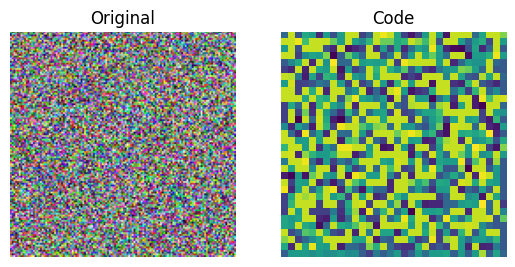

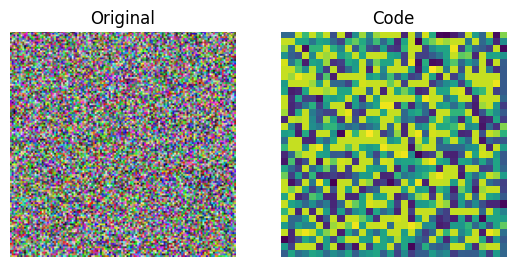

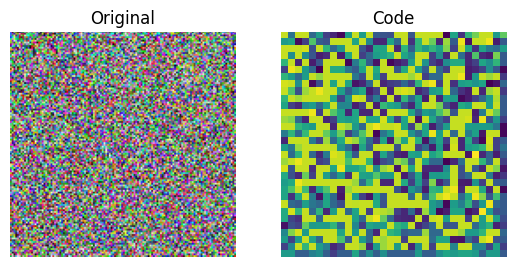

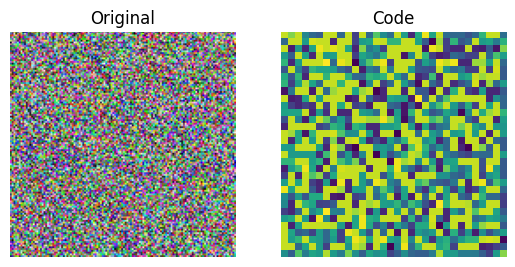

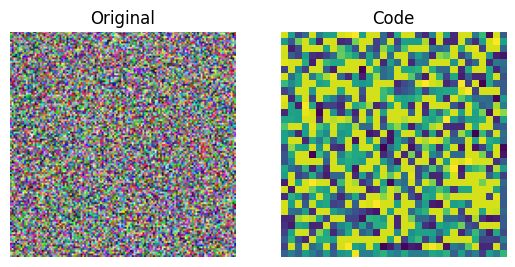

In [ ]:
encoder = vqvae_Teacher_trainer.get_layer("encoder")
quantizer = vqvae_Teacher_trainer.get_layer("vector_quantizer")

encoded_outputs = encoder.predict(test_image)
flat_enc_outputs = encoded_outputs.reshape(-1, encoded_outputs.shape[-1])
codebook_indices = quantizer.get_code_indices(flat_enc_outputs)
codebook_indices = codebook_indices.numpy().reshape(encoded_outputs.shape[:-1])

for i in range(len(test_image[:10])):
    plt.subplot(1, 2, 1)
    plt.imshow(test_image[i])
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(codebook_indices[i])
    plt.title("Code")
    plt.axis("off")
    plt.show()

# **Twisky Loss**

In [ ]:
class VectorQuantizer(layers.Layer):
    def __init__(self, num_embeddings, embedding_dim, beta=0.25, **kwargs):
        super().__init__(**kwargs)
        self.embedding_dim = embedding_dim
        self.num_embeddings = num_embeddings
        # The `beta` parameter is best kept between [0.25, 2] as per the paper.
        self.beta = beta
        # Initialize the embeddings which we will quantize.
        w_init = tf.random_uniform_initializer()
        self.embeddings = tf.Variable(
            initial_value=w_init(shape=(self.embedding_dim, self.num_embeddings), dtype="float32"), trainable=True, name="embeddings_vqvae")
    def call(self, x):
        input_shape = tf.shape(x)
        flattened = tf.reshape(x, [-1, self.embedding_dim])
        # Quantization.
        encoding_indices = self.get_code_indices(flattened)
        encodings = tf.one_hot(encoding_indices, self.num_embeddings)
        quantized = tf.matmul(encodings, self.embeddings, transpose_b=True)
        # Reshape the quantized values back to the original input shape
        quantized = tf.reshape(quantized, input_shape)
        commitment_loss = tf.reduce_mean((tf.stop_gradient(quantized) - x) ** 2)
        codebook_loss = tf.reduce_mean((quantized - tf.stop_gradient(x)) ** 2)
        self.add_loss(self.beta * commitment_loss + codebook_loss)
        # Straight-through estimator.
        quantized = x + tf.stop_gradient(quantized - x)
        return quantized

    def get_code_indices(self, flattened_inputs):
        # Calculate L2-normalized distance between the inputs and the codes.
        similarity = tf.matmul(flattened_inputs, self.embeddings)
        distances = (tf.reduce_sum(flattened_inputs ** 2, axis=1, keepdims=True)+ tf.reduce_sum(self.embeddings ** 2, axis=0)- 2 * similarity)
        # Derive the indices for minimum distances.
        encoding_indices = tf.argmin(distances, axis=1)
        return encoding_indices

In [ ]:
def get_encoder(latent_dim=16):
    encoder_inputs = keras.Input(shape=(128, 128, 3))
    x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(
        encoder_inputs
    )
    x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
    encoder_outputs = layers.Conv2D(latent_dim, 1, padding="same")(x)
    return keras.Model(encoder_inputs, encoder_outputs, name="encoder")


def get_decoder(latent_dim=16):
    latent_inputs = keras.Input(shape=get_encoder(latent_dim).output.shape[1:])
    x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(
        latent_inputs
    )
    x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
    decoder_outputs = layers.Conv2DTranspose(3, 3, padding="same", activation='sigmoid')(x)
    return keras.Model(latent_inputs, decoder_outputs, name="decoder")

In [ ]:
Data_Augmentation = keras.models.Sequential([
    keras.layers.RandomFlip(mode="horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(factor = (-0.2, 0.3), fill_mode="reflect", interpolation="bilinear")])

In [ ]:
def get_vqvae(latent_dim=16, num_embeddings=256):
    vq_layer = VectorQuantizer(num_embeddings, latent_dim, name="vector_quantizer")
    encoder = get_encoder(latent_dim)
    decoder = get_decoder(latent_dim)
    inputs = keras.Input(shape=(128, 128, 3))
    Augmented_inputs = Data_Augmentation(inputs)
    encoder_outputs = encoder(Augmented_inputs)
    quantized_latents = vq_layer(encoder_outputs)
    reconstructions = decoder(quantized_latents)
    return keras.Model(inputs, reconstructions, name="vq_vae")
get_vqvae().summary()

Model: "vq_vae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 encoder (Functional)        (None, 32, 32, 16)        20432     
                                                                 
 vector_quantizer (VectorQu  (None, 32, 32, 16)        4096      
 antizer)                                                        
                                                                 
 decoder (Functional)        (None, 128, 128, 3)       28611     
                                                                 
Total params: 53139 (207.57 KB)
Trainable params: 53139 (207.57 KB)
Non-trainable params: 0 (0.00 Byte)
______________________

In [ ]:
from keras import backend as K
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model

smooth = 1.
def dice_score(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

LOG = keras.callbacks.CSVLogger('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/Crack_Segment_VQVAE_4.csv', separator=",", append=False)

def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
import keras.backend as K

def pixel_wise_accuracy(y_true, y_pred):
    return K.mean(K.equal(K.round(y_true), K.round(y_pred)))

def mean_pixel_accuracy(y_true, y_pred):
    class_accuracy = K.mean(K.cast(K.equal(K.round(y_true), K.round(y_pred)), dtype='float32'), axis=0)
    return K.mean(class_accuracy)

def matthews_correlation_coefficient(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    numerator = intersection
    denominator = K.sqrt(K.sum(y_true) * K.sum(y_pred))
    return K.cast(numerator / denominator, dtype='float32')

def intersection_over_union(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1) - intersection
    iou = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(iou, axis=-1)

def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true + y_pred, axis=-1) - intersection
    jaccard = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(jaccard, axis=-1)


In [ ]:
import tensorflow as tf

def dice_loss(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1-((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))

# Custom Focal Loss function
def focal_loss(y_true, y_pred, alpha=0.25, gamma=2.0):
    # Compute binary cross-entropy loss for each channel
    binary_ce = tf.keras.losses.binary_crossentropy(y_true, y_pred, from_logits=True)
    # Modify the loss for each channel
    focal_loss = alpha * (1 - tf.exp(-binary_ce)) ** gamma * binary_ce
    # Sum the loss across channels
    focal_loss = tf.reduce_sum(focal_loss, axis=-1)
    return tf.reduce_mean(focal_loss)

# Custom Tversky Loss function
def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    true_positives = tf.reduce_sum(y_true * y_pred)
    false_positives = tf.reduce_sum((1 - y_true) * y_pred)
    false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
    tversky = (true_positives + 1e-5) / (true_positives + alpha * false_positives + beta * false_negatives + 1e-5)
    return 1 - tversky

In [ ]:
vqvae_Teacher_trainer = get_vqvae(latent_dim=16, num_embeddings=256)
vqvae_Teacher_trainer.compile(optimizer=keras.optimizers.Adam(), loss= tversky_loss, metrics=[ 'accuracy', dice_score,
                                                                                                      mean_pixel_accuracy,
                                                                                                      matthews_correlation_coefficient,
                                                                                                      intersection_over_union,
                                                                                                      jaccard_index,
                                                                                                      keras.metrics.Recall(),
                                                                                                      keras.metrics.Precision(), get_f1])

In [ ]:
Hist = vqvae_Teacher_trainer.fit(train_image, train_mask
                        , epochs=30, batch_size=16, validation_data=(test_image, test_mask), callbacks=[LOG])

Epoch 1/30
313/313 [==============================] - 27s 41ms/step - loss: 0.9268 - accuracy: 0.6135 - dice_score: 0.0961 - mean_pixel_accuracy: 0.4213 - matthews_correlation_coefficient: 0.1669 - intersection_over_union: 0.0304 - jaccard_index: 0.0304 - recall: 0.6329 - precision: 0.0653 - get_f1: 0.0952 - val_loss: 0.8696 - val_accuracy: 0.3951 - val_dice_score: 0.1460 - val_mean_pixel_accuracy: 0.8142 - val_matthews_correlation_coefficient: nan - val_intersection_over_union: 0.0243 - val_jaccard_index: 0.0243 - val_recall: 0.5142 - val_precision: 0.1331 - val_get_f1: 0.1454
Epoch 2/30
313/313 [==============================] - 8s 24ms/step - loss: 0.9090 - accuracy: 0.4280 - dice_score: 0.1068 - mean_pixel_accuracy: 0.7910 - matthews_correlation_coefficient: 0.1350 - intersection_over_union: 0.0422 - jaccard_index: 0.0422 - recall: 0.2581 - precision: 0.0835 - get_f1: 0.1067 - val_loss: 0.8721 - val_accuracy: 0.4567 - val_dice_score: 0.1437 - val_mean_pixel_accuracy: 0.8262 - val_m

In [ ]:
from keras.models import load_model

from keras import backend as K
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model

class VectorQuantizer(layers.Layer):
    def __init__(self, num_embeddings, embedding_dim, beta=0.25, **kwargs):
        super().__init__(**kwargs)
        self.embedding_dim = embedding_dim
        self.num_embeddings = num_embeddings
        # The `beta` parameter is best kept between [0.25, 2] as per the paper.
        self.beta = beta
        # Initialize the embeddings which we will quantize.
        w_init = tf.random_uniform_initializer()
        self.embeddings = tf.Variable(
            initial_value=w_init(shape=(self.embedding_dim, self.num_embeddings), dtype="float32"), trainable=True, name="embeddings_vqvae")
    def call(self, x):
        input_shape = tf.shape(x)
        flattened = tf.reshape(x, [-1, self.embedding_dim])
        # Quantization.
        encoding_indices = self.get_code_indices(flattened)
        encodings = tf.one_hot(encoding_indices, self.num_embeddings)
        quantized = tf.matmul(encodings, self.embeddings, transpose_b=True)
        # Reshape the quantized values back to the original input shape
        quantized = tf.reshape(quantized, input_shape)
        commitment_loss = tf.reduce_mean((tf.stop_gradient(quantized) - x) ** 2)
        codebook_loss = tf.reduce_mean((quantized - tf.stop_gradient(x)) ** 2)
        self.add_loss(self.beta * commitment_loss + codebook_loss)
        # Straight-through estimator.
        quantized = x + tf.stop_gradient(quantized - x)
        return quantized

    def get_code_indices(self, flattened_inputs):
        # Calculate L2-normalized distance between the inputs and the codes.
        similarity = tf.matmul(flattened_inputs, self.embeddings)
        distances = (tf.reduce_sum(flattened_inputs ** 2, axis=1, keepdims=True)+ tf.reduce_sum(self.embeddings ** 2, axis=0)- 2 * similarity)
        # Derive the indices for minimum distances.
        encoding_indices = tf.argmin(distances, axis=1)
        return encoding_indices

smooth = 1.
def dice_score(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

import keras.backend as K

def pixel_wise_accuracy(y_true, y_pred):
    return K.mean(K.equal(K.round(y_true), K.round(y_pred)))

def mean_pixel_accuracy(y_true, y_pred):
    class_accuracy = K.mean(K.cast(K.equal(K.round(y_true), K.round(y_pred)), dtype='float32'), axis=0)
    return K.mean(class_accuracy)

def matthews_correlation_coefficient(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    numerator = intersection
    denominator = K.sqrt(K.sum(y_true) * K.sum(y_pred))
    return K.cast(numerator / denominator, dtype='float32')

def intersection_over_union(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1) - intersection
    iou = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(iou, axis=-1)

def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true + y_pred, axis=-1) - intersection
    jaccard = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(jaccard, axis=-1)

# Custom Tversky Loss function
def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    true_positives = tf.reduce_sum(y_true * y_pred)
    false_positives = tf.reduce_sum((1 - y_true) * y_pred)
    false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
    tversky = (true_positives + 1e-5) / (true_positives + alpha * false_positives + beta * false_negatives + 1e-5)
    return 1 - tversky

Tvisky = load_model('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/vqvae_Teacher_4_twisky.h5', custom_objects = {
    'VectorQuantizer':VectorQuantizer, "tversky_loss":tversky_loss, "dice_score":dice_score, "pixel_wise_accuracy":pixel_wise_accuracy,
    'mean_pixel_accuracy':mean_pixel_accuracy, "matthews_correlation_coefficient":matthews_correlation_coefficient,
   "intersection_over_union":intersection_over_union, "jaccard_index":jaccard_index, "get_f1":get_f1 })

In [ ]:
Tvisky.summary()

Model: "vq_vae"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 128, 128, 3)       0         
                                                                 
 encoder (Functional)        (None, 32, 32, 16)        20432     
                                                                 
 vector_quantizer (VectorQu  (None, 32, 32, 16)        4096      
 antizer)                                                        
                                                                 
 decoder (Functional)        (None, 128, 128, 3)       28611     
                                                                 
Total params: 53139 (207.57 KB)
Trainable params: 53139 (207.57 KB)
Non-trainable params: 0 (0.00 Byte)
______________________

In [ ]:
Tvisky.evaluate(test_image, test_mask)

In [ ]:
vqvae_Teacher_trainer.save('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/vqvae_Teacher_4_twisky.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

plt.rcParams['figure.figsize'] = (15, 9)
sns.set_style("whitegrid", {'axes.grid': False})

# Assuming test_image contains your images
for i, image in enumerate(train_image[2985:3000]):
    plt.subplot(3, 5, i + 1)
    plt.axis("off")
    plt.imshow(image, aspect='auto')

plt.subplots_adjust(hspace=0.01, wspace=0.01)
plt.show()

1/1 [==============================] - 0s 112ms/step


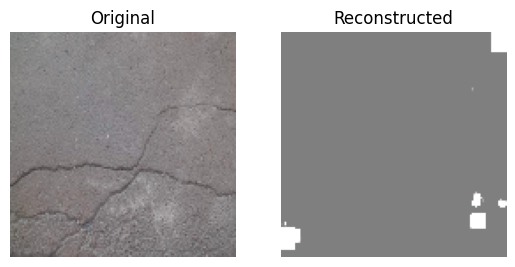

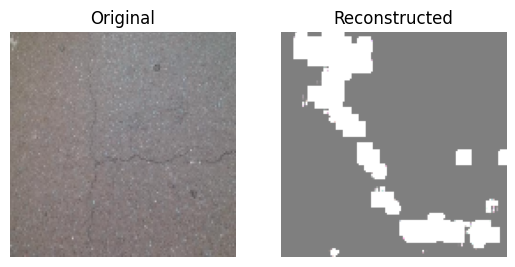

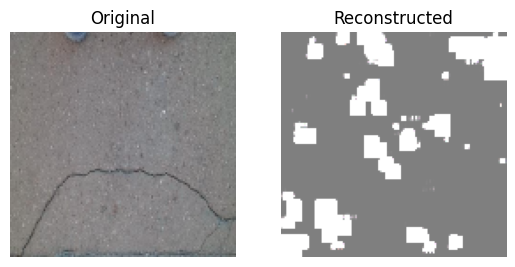

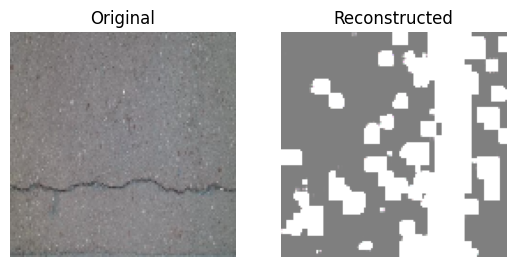

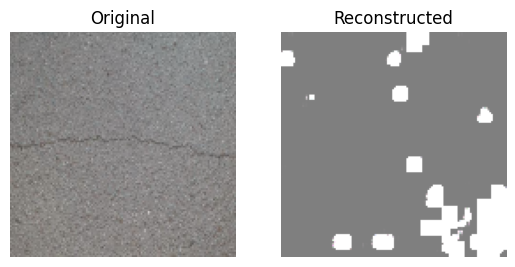

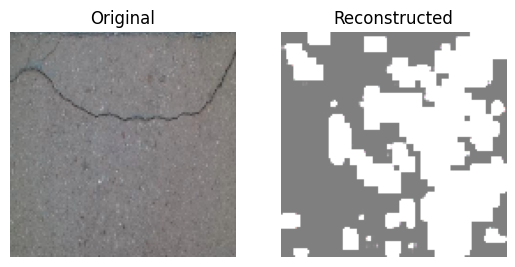

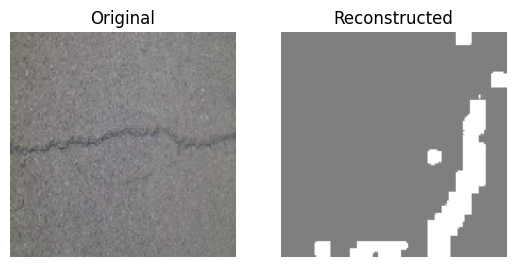

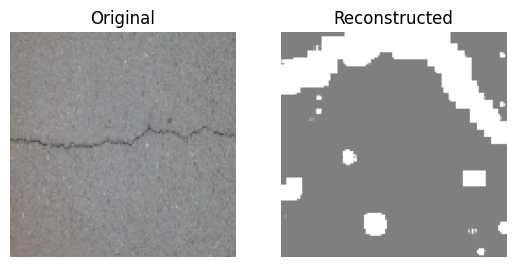

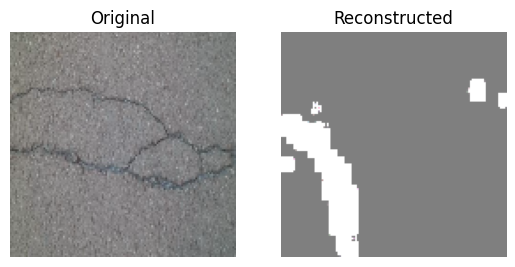

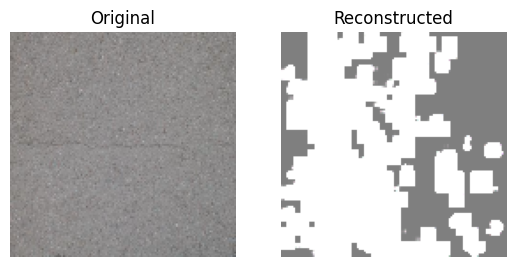

In [ ]:
def show_subplot(original, reconstructed):
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed.squeeze() + 0.5)
    plt.title("Reconstructed")
    plt.axis("off")
    plt.show()

trained_vqvae_model = Tvisky
reconstructions_test = Tvisky.predict(train_image[500:510])

for test_images, reconstructed_image in zip(train_image, reconstructions_test):
    show_subplot(test_images, reconstructed_image)

1/1 [==============================] - 0s 231ms/step


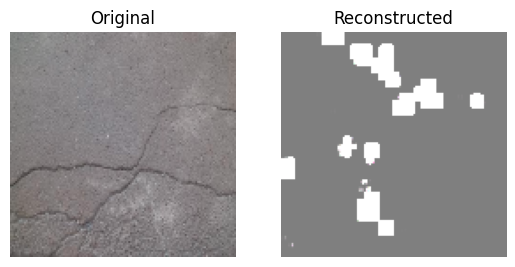

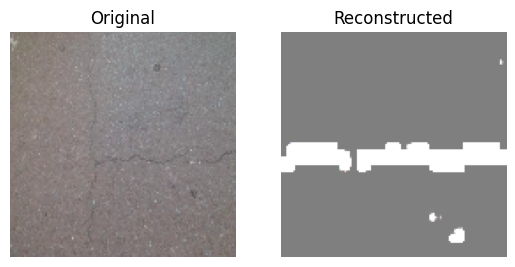

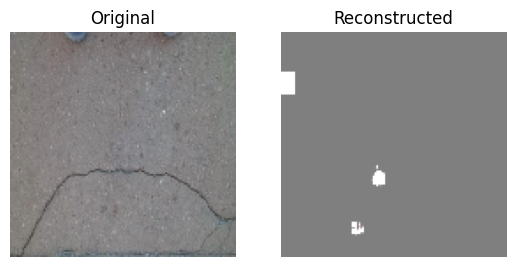

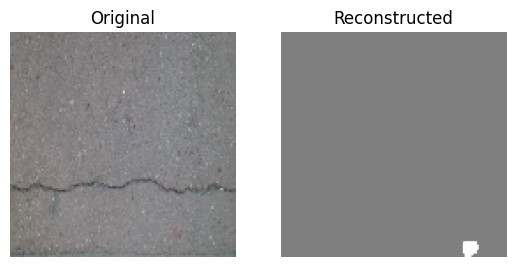

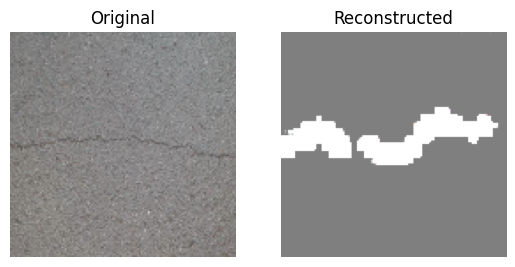

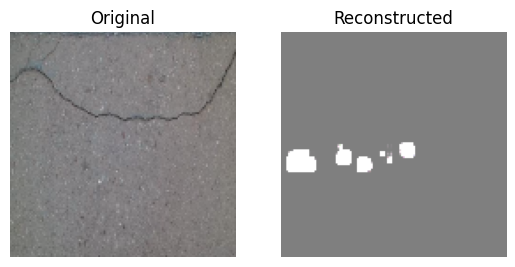

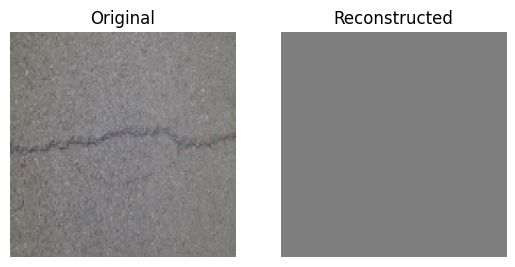

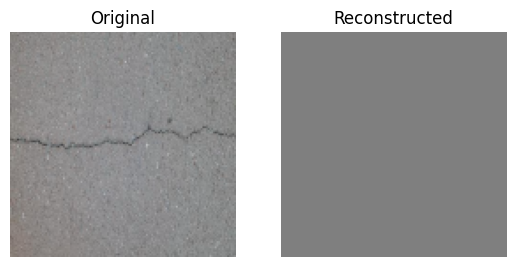

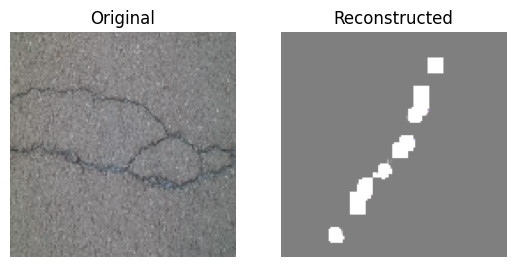

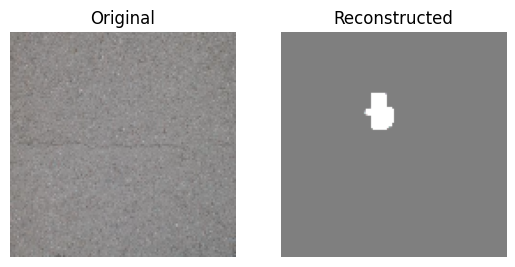

In [ ]:
def show_subplot(original, reconstructed):
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed.squeeze() + 0.5)
    plt.title("Reconstructed")
    plt.axis("off")
    plt.show()

trained_vqvae_model = Tvisky
reconstructions_test = Tvisky.predict(train_image[2980:2990])

for test_images, reconstructed_image in zip(train_image, reconstructions_test):
    show_subplot(test_images, reconstructed_image)

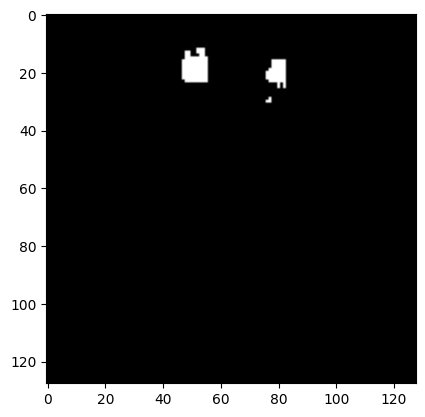

In [ ]:
plt.imshow(np.round(reconstructions_test[0]))

In [ ]:
(test_images[0]*reconstructions_test[0])

In [ ]:
test_image.shape

(128, 128, 3)

In [ ]:
test_images

4/4 [==============================] - 0s 35ms/step


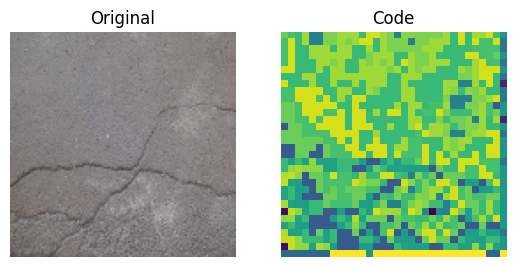

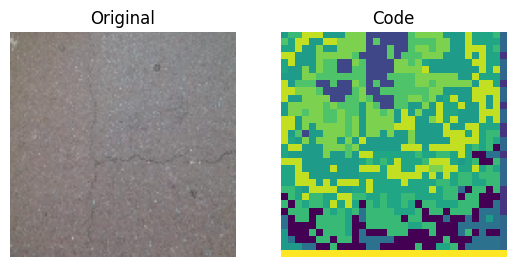

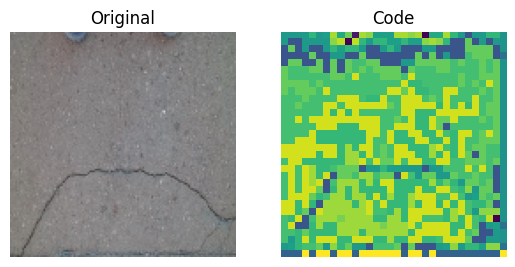

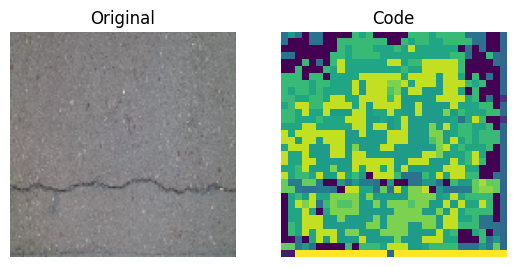

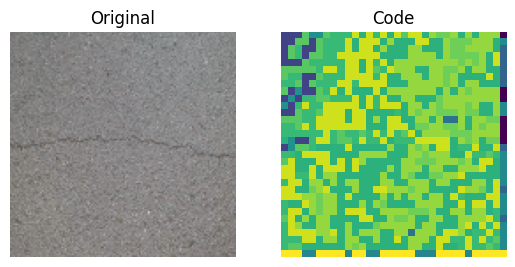

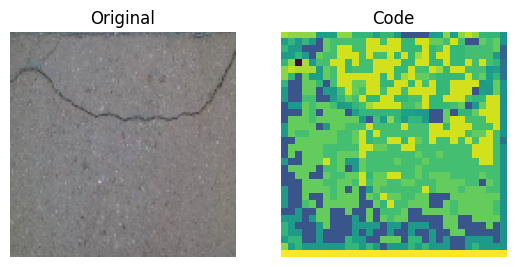

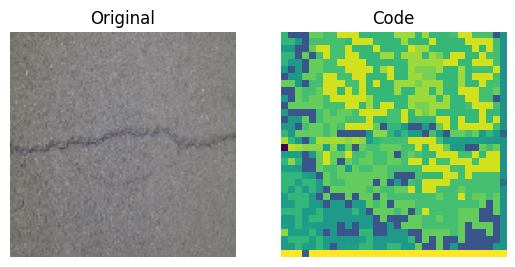

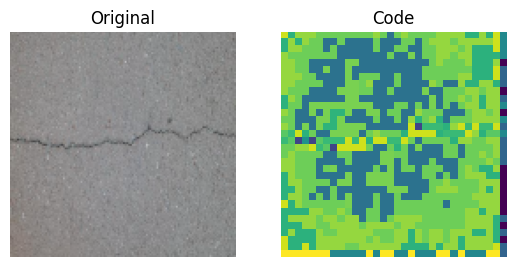

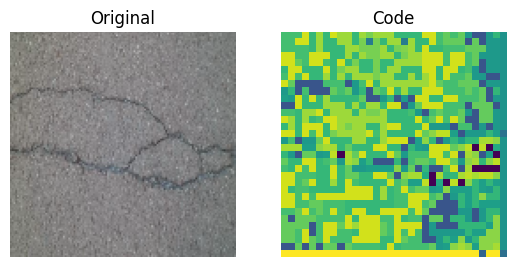

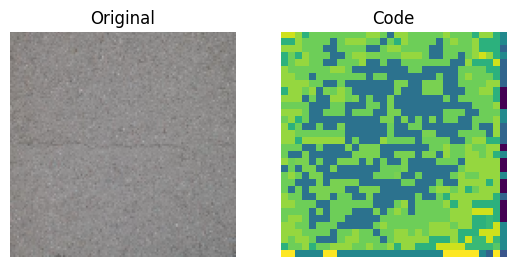

In [ ]:
encoder = Tvisky.get_layer("encoder")
quantizer = Tvisky.get_layer("vector_quantizer")

encoded_outputs = encoder.predict(train_image[:100])
flat_enc_outputs = encoded_outputs.reshape(-1, encoded_outputs.shape[-1])
codebook_indices = quantizer.get_code_indices(flat_enc_outputs)
codebook_indices = codebook_indices.numpy().reshape(encoded_outputs.shape[:-1])

for i in range(len(train_image[:10])):
    plt.subplot(1, 2, 1)
    plt.imshow(train_image[i])
    plt.title("Original")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(codebook_indices[i])
    plt.title("Code")
    plt.axis("off")
    plt.show()

4/4 [==============================] - 0s 43ms/step


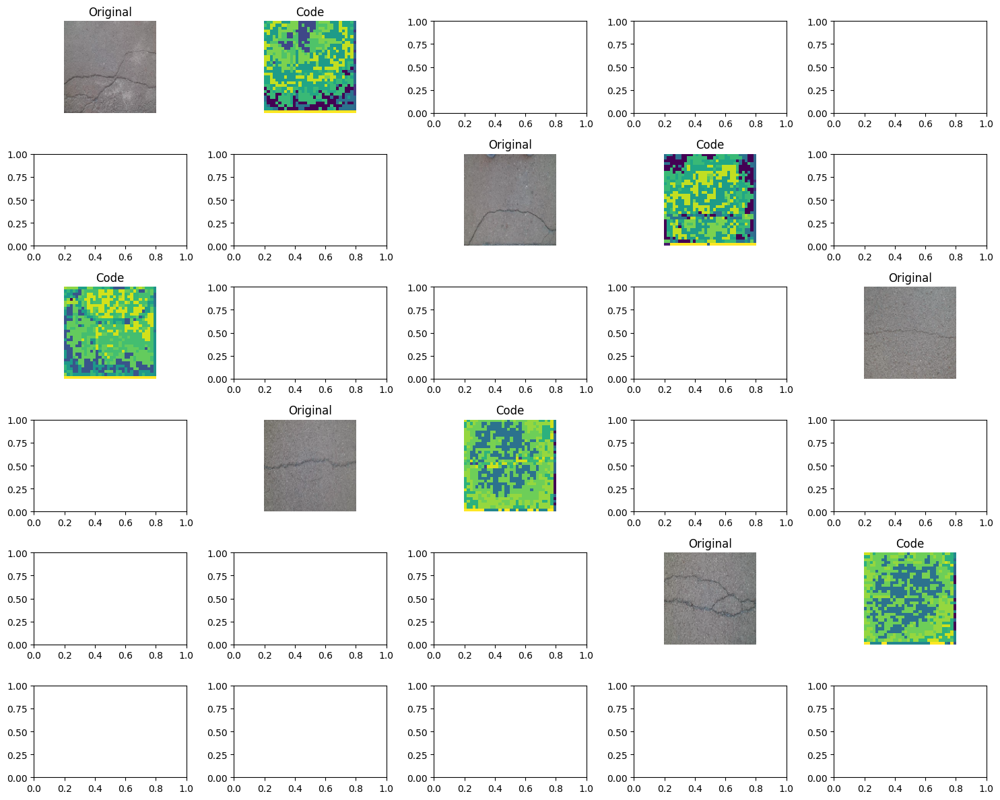

In [ ]:
encoder = Tvisky.get_layer("encoder")
quantizer = Tvisky.get_layer("vector_quantizer")

encoded_outputs = encoder.predict(train_image[:100])
flat_enc_outputs = encoded_outputs.reshape(-1, encoded_outputs.shape[-1])
codebook_indices = quantizer.get_code_indices(flat_enc_outputs)
codebook_indices = codebook_indices.numpy().reshape(encoded_outputs.shape[:-1])

fig, axs = plt.subplots(6, 5, figsize=(15, 12))

for i in range(10):
    row = i // 2
    col = i % 5
    if i % 2 == 0:
        # Show the original image in odd rows
        axs[row, col].imshow(train_image[i])
        axs[row, col].set_title("Original")
        axs[row, col].axis("off")
    else:
        # Show the codebook indices in even rows
        axs[row, col].imshow(codebook_indices[i])
        axs[row, col].set_title("Code")
        axs[row, col].axis("off")

plt.tight_layout()
plt.savefig('images_and_codes.png', format='png', dpi=300)
plt.show()


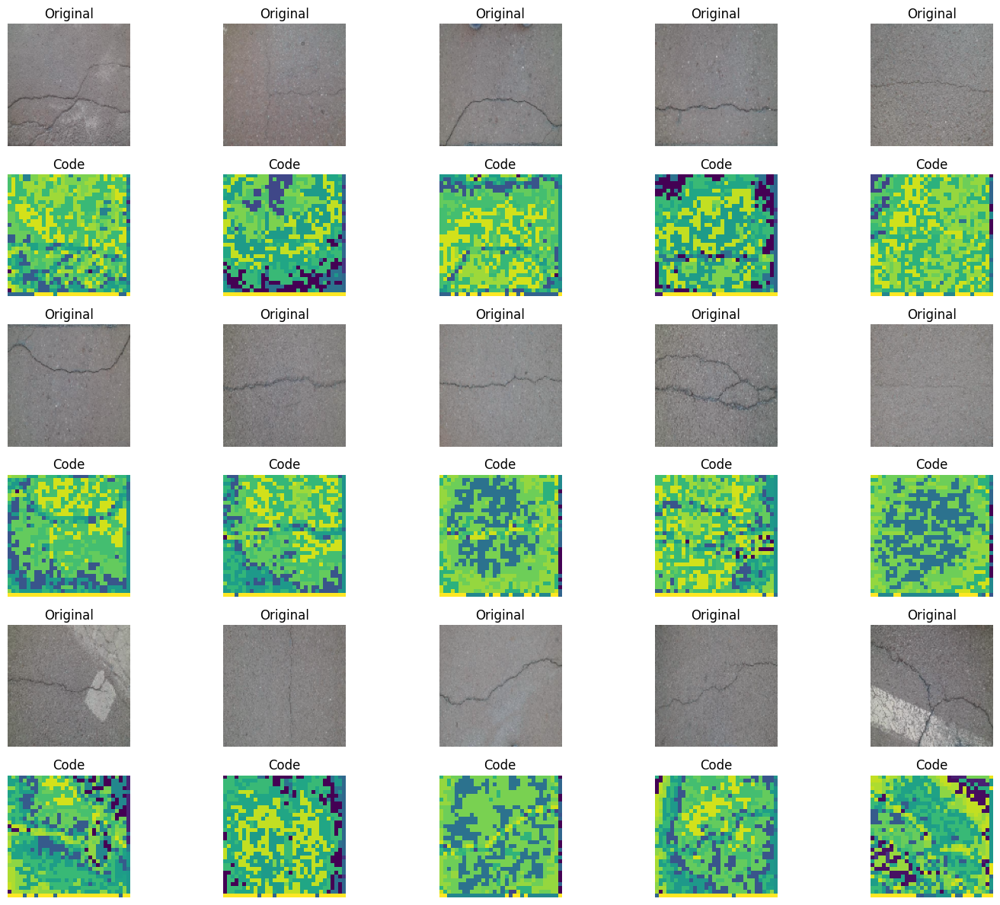

In [ ]:
import matplotlib.pyplot as plt

# Create a 6x5 grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(15, 12))

# Plot the first pair
axs[0, 0].imshow(train_image[0])
axs[0, 0].set_title("Original")
axs[0, 0].axis("off")
axs[1, 0].imshow(codebook_indices[0])
axs[1, 0].set_title("Code")
axs[1, 0].axis("off")

# Repeat for the rest of the pairs
axs[0, 1].imshow(train_image[1])
axs[0, 1].set_title("Original")
axs[0, 1].axis("off")
axs[1, 1].imshow(codebook_indices[1])
axs[1, 1].set_title("Code")
axs[1, 1].axis("off")

# Plot the first pair
axs[0, 2].imshow(train_image[2])
axs[0, 2].set_title("Original")
axs[0, 2].axis("off")
axs[1, 2].imshow(codebook_indices[2])
axs[1, 2].set_title("Code")
axs[1, 2].axis("off")

# Repeat for the rest of the pairs
axs[0, 3].imshow(train_image[3])
axs[0, 3].set_title("Original")
axs[0, 3].axis("off")
axs[1, 3].imshow(codebook_indices[3])
axs[1, 3].set_title("Code")
axs[1, 3].axis("off")
# Continue for the remaining pairs
# Plot the first pair
axs[0, 4].imshow(train_image[4])
axs[0, 4].set_title("Original")
axs[0, 4].axis("off")
axs[1, 4].imshow(codebook_indices[4])
axs[1, 4].set_title("Code")
axs[1, 4].axis("off")

# Repeat for the rest of the pairs
axs[2, 0].imshow(train_image[5])
axs[2, 0].set_title("Original")
axs[2, 0].axis("off")
axs[3, 0].imshow(codebook_indices[5])
axs[3, 0].set_title("Code")
axs[3, 0].axis("off")

axs[2, 1].imshow(train_image[6])
axs[2, 1].set_title("Original")
axs[2, 1].axis("off")
axs[3, 1].imshow(codebook_indices[6])
axs[3, 1].set_title("Code")
axs[3, 1].axis("off")

axs[2, 2].imshow(train_image[7])
axs[2, 2].set_title("Original")
axs[2, 2].axis("off")
axs[3, 2].imshow(codebook_indices[7])
axs[3, 2].set_title("Code")
axs[3, 2].axis("off")

axs[2, 3].imshow(train_image[8])
axs[2, 3].set_title("Original")
axs[2, 3].axis("off")
axs[3, 3].imshow(codebook_indices[8])
axs[3, 3].set_title("Code")
axs[3, 3].axis("off")

axs[2, 4].imshow(train_image[9])
axs[2, 4].set_title("Original")
axs[2, 4].axis("off")
axs[3, 4].imshow(codebook_indices[9])
axs[3, 4].set_title("Code")
axs[3, 4].axis("off")
# Save the figure in high-quality PNG format


axs[4, 0].imshow(train_image[10])
axs[4, 0].set_title("Original")
axs[4, 0].axis("off")
axs[5, 0].imshow(codebook_indices[10])
axs[5, 0].set_title("Code")
axs[5, 0].axis("off")

axs[4, 1].imshow(train_image[11])
axs[4, 1].set_title("Original")
axs[4, 1].axis("off")
axs[5, 1].imshow(codebook_indices[11])
axs[5, 1].set_title("Code")
axs[5, 1].axis("off")

axs[4, 2].imshow(train_image[12])
axs[4, 2].set_title("Original")
axs[4, 2].axis("off")
axs[5, 2].imshow(codebook_indices[12])
axs[5, 2].set_title("Code")
axs[5, 2].axis("off")

axs[4, 3].imshow(train_image[13])
axs[4, 3].set_title("Original")
axs[4, 3].axis("off")
axs[5, 3].imshow(codebook_indices[13])
axs[5, 3].set_title("Code")
axs[5, 3].axis("off")

axs[4, 4].imshow(train_image[14])
axs[4, 4].set_title("Original")
axs[4, 4].axis("off")
axs[5, 4].imshow(codebook_indices[14])
axs[5, 4].set_title("Code")
axs[5, 4].axis("off")

plt.tight_layout()
plt.savefig('images_and_codes_1.png', format='png', dpi=600)
plt.show()


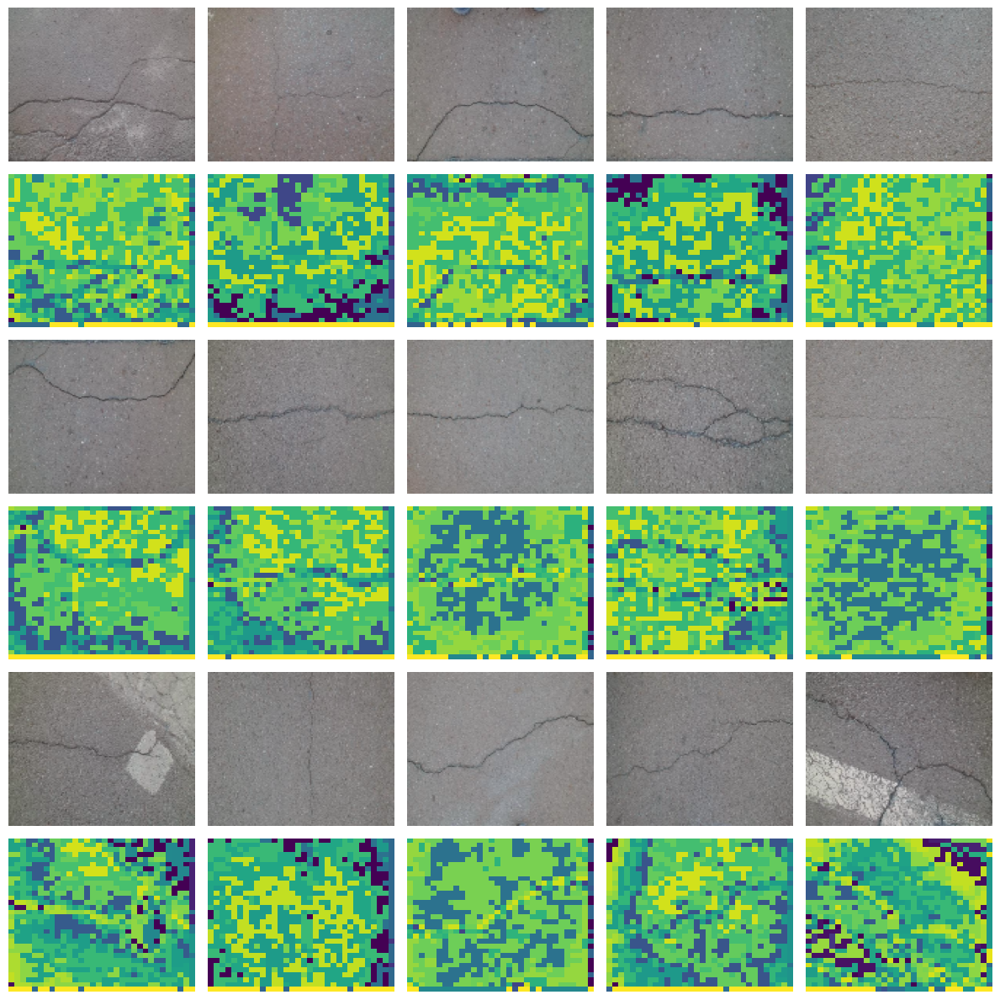

In [ ]:
import matplotlib.pyplot as plt

# Create a 6x5 grid of subplots
fig, axs = plt.subplots(6, 5, figsize=(12, 12))

# Plot the first pair
axs[0, 0].imshow(train_image[0], aspect='auto')
axs[0, 0].axis("off")
axs[1, 0].imshow(codebook_indices[0], aspect='auto')
axs[1, 0].axis("off")

# Repeat for the rest of the pairs
axs[0, 1].imshow(train_image[1], aspect='auto')
axs[0, 1].axis("off")
axs[1, 1].imshow(codebook_indices[1], aspect='auto')
axs[1, 1].axis("off")

# Plot the first pair
axs[0, 2].imshow(train_image[2], aspect='auto')
axs[0, 2].axis("off")
axs[1, 2].imshow(codebook_indices[2], aspect='auto')
axs[1, 2].axis("off")

# Repeat for the rest of the pairs
axs[0, 3].imshow(train_image[3], aspect='auto')
axs[0, 3].axis("off")
axs[1, 3].imshow(codebook_indices[3], aspect='auto')
axs[1, 3].axis("off")

# Continue for the remaining pairs
# Plot the first pair
axs[0, 4].imshow(train_image[4], aspect='auto')
axs[0, 4].axis("off")
axs[1, 4].imshow(codebook_indices[4], aspect='auto')
axs[1, 4].axis("off")

# Repeat for the rest of the pairs
axs[2, 0].imshow(train_image[5], aspect='auto')
axs[2, 0].axis("off")
axs[3, 0].imshow(codebook_indices[5], aspect='auto')
axs[3, 0].axis("off")

axs[2, 1].imshow(train_image[6], aspect='auto')
axs[2, 1].axis("off")
axs[3, 1].imshow(codebook_indices[6], aspect='auto')
axs[3, 1].axis("off")

axs[2, 2].imshow(train_image[7], aspect='auto')
axs[2, 2].axis("off")
axs[3, 2].imshow(codebook_indices[7], aspect='auto')
axs[3, 2].axis("off")

axs[2, 3].imshow(train_image[8], aspect='auto')
axs[2, 3].axis("off")
axs[3, 3].imshow(codebook_indices[8], aspect='auto')
axs[3, 3].axis("off")

axs[2, 4].imshow(train_image[9], aspect='auto')
axs[2, 4].axis("off")
axs[3, 4].imshow(codebook_indices[9], aspect='auto')
axs[3, 4].axis("off")

# Save the figure in high-quality PNG format

axs[4, 0].imshow(train_image[10], aspect='auto')
axs[4, 0].axis("off")
axs[5, 0].imshow(codebook_indices[10], aspect='auto')
axs[5, 0].axis("off")

axs[4, 1].imshow(train_image[11], aspect='auto')
axs[4, 1].axis("off")
axs[5, 1].imshow(codebook_indices[11], aspect='auto')
axs[5, 1].axis("off")

axs[4, 2].imshow(train_image[12], aspect='auto')
axs[4, 2].axis("off")
axs[5, 2].imshow(codebook_indices[12], aspect='auto')
axs[5, 2].axis("off")

axs[4, 3].imshow(train_image[13], aspect='auto')
axs[4, 3].axis("off")
axs[5, 3].imshow(codebook_indices[13], aspect='auto')
axs[5, 3].axis("off")

axs[4, 4].imshow(train_image[14], aspect='auto')
axs[4, 4].axis("off")
axs[5, 4].imshow(codebook_indices[14], aspect='auto')
axs[5, 4].axis("off")

plt.tight_layout()
plt.savefig('images_and_codes_1.png', format='png', dpi=600)
plt.show()


In [ ]:
train_image.shape

(5000, 128, 128, 3)

# **Visualization**

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/Crack_Segment_VQVAE_4.csv')
data.head()

,epoch,accuracy,dice_score,get_f1,intersection_over_union,jaccard_index,loss,matthews_correlation_coefficient,mean_pixel_accuracy,precision,...,val_accuracy,val_dice_score,val_get_f1,val_intersection_over_union,val_jaccard_index,val_loss,val_matthews_correlation_coefficient,val_mean_pixel_accuracy,val_precision,val_recall
0,0,0.613496,0.096099,0.095153,0.030380,0.030380,0.926766,0.166869,0.421291,0.065286,...,0.395101,0.146006,0.145437,0.024252,0.024252,0.869642,NaN,0.814224,0.133101,0.514175
1,1,0.427962,0.106828,0.106712,0.042207,0.042207,0.908985,0.135014,0.790974,0.083534,...,0.456662,0.143692,0.142917,0.031663,0.031663,0.872064,NaN,0.826189,0.138735,0.499556
2,2,0.439722,0.107397,0.107282,0.058483,0.058483,0.908816,0.128338,0.826999,0.090804,...,0.432311,0.153829,0.153056,0.037607,0.037607,0.859957,NaN,0.880949,0.178970,0.427923
3,3,0.420698,0.107530,0.107450,0.053043,0.053043,0.906363,0.124471,0.846853,0.095289,...,0.594119,0.130089,0.130779,0.024592,0.024592,0.892457,NaN,0.696526,0.100380,0.642717
4,4,0.424665,0.108807,0.108706,0.069751,0.069751,0.906345,0.126526,0.842528,0.094758,...,0.364836,0.158828,0.149564,0.305765,0.305765,0.858331,NaN,0.918794,0.228508,0.342079


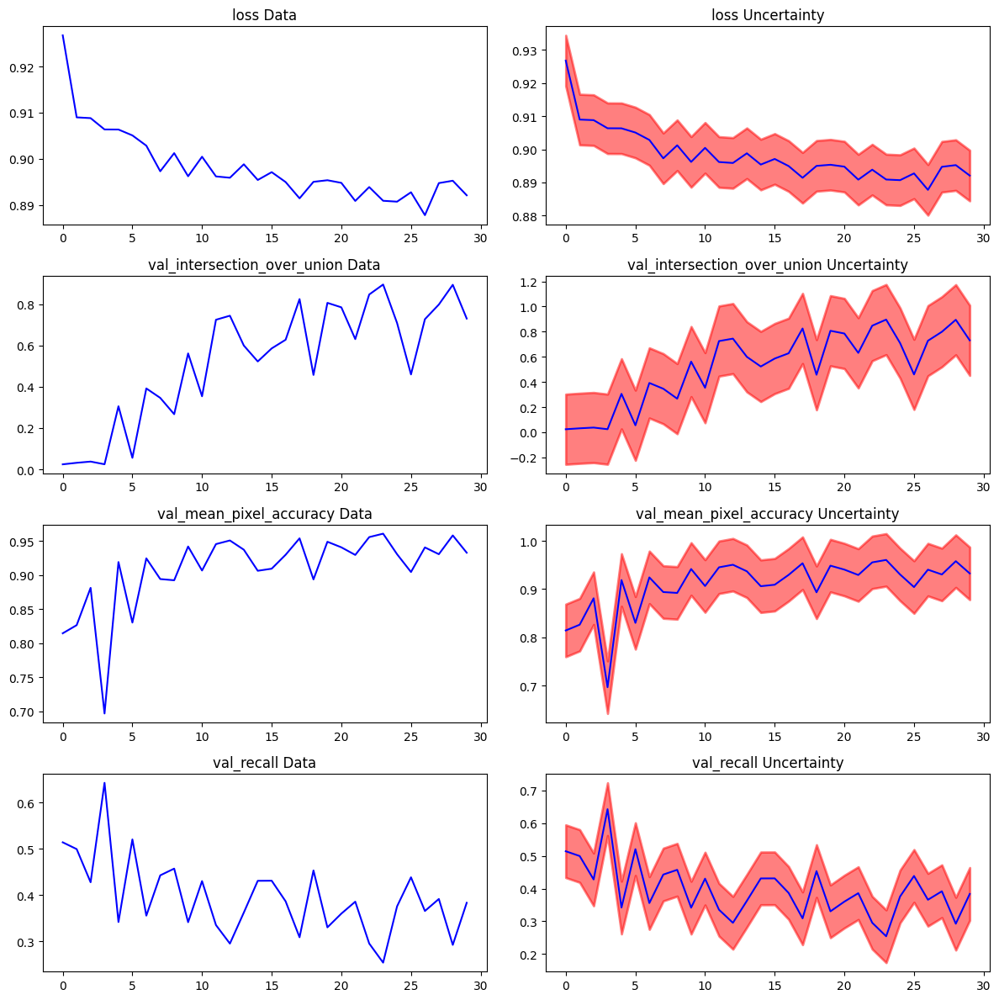

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Simulated data (replace with your own data)
metrics = ["loss", "val_intersection_over_union", "val_mean_pixel_accuracy", "val_recall"]
DAAT = {
    "loss": data['loss'].to_list(),
    "val_intersection_over_union": data['val_intersection_over_union'].to_list(),
    "val_mean_pixel_accuracy": data['val_mean_pixel_accuracy'].to_list(),
    "val_recall": data['val_recall'].to_list()
}

# Function to calculate Bayesian uncertainty
def calculate_uncertainty(data1):
    # Use statistical methods or Bayesian approaches to calculate uncertainty
    uncertainty = np.std(data1)  # Using standard deviation as an example
    return uncertainty

# Function to generate uncertainty bounds
def generate_uncertainty_bounds(metric_data, uncertainty_data):
    lower_bound = [metric - uncertainty_data for metric in metric_data]
    upper_bound = [metric + uncertainty_data for metric in metric_data]
    return lower_bound, upper_bound

# Create a figure with subplots
fig, axs = plt.subplots(4, 2, figsize=(12, 12))

for i, metric in enumerate(metrics):
    # Data for the current metric
    metric_data = DAAT[metric]

    # Calculate uncertainty for the current metric
    uncertainty_data = calculate_uncertainty(metric_data)

    # Generate uncertainty bounds for the current metric
    lower_bound, upper_bound = generate_uncertainty_bounds(metric_data, uncertainty_data)

    # Plot the original data
    axs[i, 0].plot(range(len(metric_data)), metric_data, label=f"{metric}", color='blue')
    axs[i, 0].set_title(f"{metric} Data")

    # Plot the uncertainty with bounds as thicker lines with lighter color
    axs[i, 1].plot(range(len(metric_data)), metric_data, label=f"{metric}", color='blue')
    axs[i, 1].fill_between(range(len(metric_data)), lower_bound, upper_bound, color='red', alpha=0.5, label='Uncertainty', linewidth=2)
    axs[i, 1].set_title(f"{metric} Uncertainty")

# Adjust layout
plt.tight_layout()

# Save the figure as a high-quality PNG
plt.savefig('metrics_uncertainty_variation.png', format='png', dpi=300)

# Show the figure
plt.show()


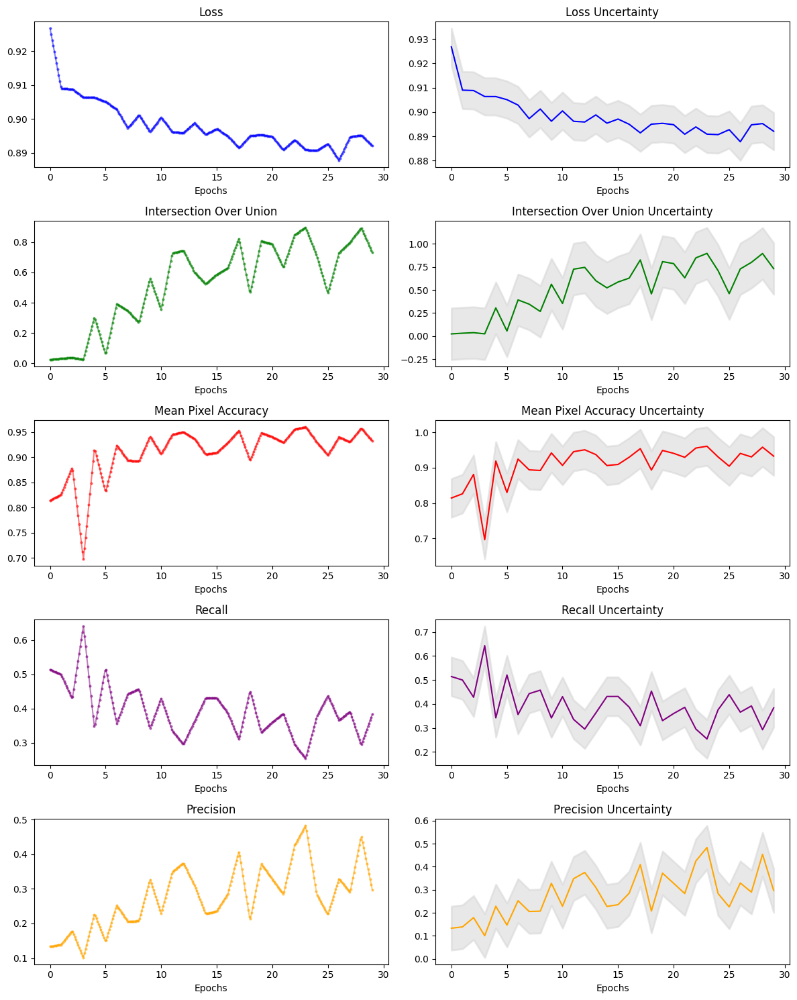

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Simulated data (replace with your own data)
metrics = ["Loss", "Intersection Over Union", "Mean Pixel Accuracy", "Recall", "Precision"]
DAAT = {
    "Loss": data['loss'].to_list(),
    "Intersection Over Union": data['val_intersection_over_union'].to_list(),
    "Mean Pixel Accuracy": data['val_mean_pixel_accuracy'].to_list(),
    "Recall": data['val_recall'].to_list(),
    "Precision": data['val_precision'].to_list()  # Add Precision data
}

# Define colors for each row
row_colors = ['blue', 'green', 'red', 'purple', 'orange']  # Add a color for the new row

# Function to calculate Bayesian uncertainty
def calculate_uncertainty(data1):
    # Use statistical methods or Bayesian approaches to calculate uncertainty
    uncertainty = np.std(data1)  # Using standard deviation as an example
    return uncertainty

# Function to generate uncertainty bounds
def generate_uncertainty_bounds(metric_data, uncertainty_data):
    lower_bound = [metric - uncertainty_data for metric in metric_data]
    upper_bound = [metric + uncertainty_data for metric in metric_data]
    return lower_bound, upper_bound

# Create a figure with subplots
fig, axs = plt.subplots(5, 2, figsize=(12, 15))  # Extend the number of rows

for i, metric in enumerate(metrics):
    # Data for the current metric
    metric_data = DAAT[metric]

    # Calculate uncertainty for the current metric
    uncertainty_data = calculate_uncertainty(metric_data)

    # Generate uncertainty bounds for the current metric
    lower_bound, upper_bound = generate_uncertainty_bounds(metric_data, uncertainty_data)

    # Plot the original data with denser curve lines
    x_dense = np.linspace(0, len(metric_data) - 1, 10 * len(metric_data))  # Create denser x-axis values
    y_dense = np.interp(x_dense, range(len(metric_data)), metric_data)  # Interpolate for denser y-values
    axs[i, 0].plot(x_dense, y_dense, label=f"{metric}", color=row_colors[i % 5], marker='o', linestyle='-', markersize=2, alpha=0.5)
    axs[i, 0].set_title(f"{metric}")
    axs[i, 0].set_xlabel("Epochs")  # Add x-axis label

    # Plot the uncertainty with bounds as thicker lines with lighter color
    axs[i, 1].plot(range(len(metric_data)), metric_data, label=f"{metric}", color=row_colors[i % 5])
    axs[i, 1].fill_between(range(len(metric_data)), lower_bound, upper_bound, color='lightgrey', alpha=0.5, linewidth=2)
    axs[i, 1].set_title(f"{metric} Uncertainty")
    axs[i, 1].set_xlabel("Epochs")  # Add x-axis label

# Adjust layout
plt.tight_layout()

# Save the figure as a high-quality PNG
plt.savefig('metrics_uncertainty_variation.png', format='png', dpi=300)

# Show the figure
plt.show()


## Code Book Visualization

In [ ]:
from keras.models import load_model

from keras import backend as K
from keras.callbacks import Callback,ModelCheckpoint
from keras.models import Sequential,load_model

class VectorQuantizer(layers.Layer):
    def __init__(self, num_embeddings, embedding_dim, beta=0.25, **kwargs):
        super().__init__(**kwargs)
        self.embedding_dim = embedding_dim
        self.num_embeddings = num_embeddings
        # The `beta` parameter is best kept between [0.25, 2] as per the paper.
        self.beta = beta
        # Initialize the embeddings which we will quantize.
        w_init = tf.random_uniform_initializer()
        self.embeddings = tf.Variable(
            initial_value=w_init(shape=(self.embedding_dim, self.num_embeddings), dtype="float32"), trainable=True, name="embeddings_vqvae")
    def call(self, x):
        input_shape = tf.shape(x)
        flattened = tf.reshape(x, [-1, self.embedding_dim])
        # Quantization.
        encoding_indices = self.get_code_indices(flattened)
        encodings = tf.one_hot(encoding_indices, self.num_embeddings)
        quantized = tf.matmul(encodings, self.embeddings, transpose_b=True)
        # Reshape the quantized values back to the original input shape
        quantized = tf.reshape(quantized, input_shape)
        commitment_loss = tf.reduce_mean((tf.stop_gradient(quantized) - x) ** 2)
        codebook_loss = tf.reduce_mean((quantized - tf.stop_gradient(x)) ** 2)
        self.add_loss(self.beta * commitment_loss + codebook_loss)
        # Straight-through estimator.
        quantized = x + tf.stop_gradient(quantized - x)
        return quantized

    def get_code_indices(self, flattened_inputs):
        # Calculate L2-normalized distance between the inputs and the codes.
        similarity = tf.matmul(flattened_inputs, self.embeddings)
        distances = (tf.reduce_sum(flattened_inputs ** 2, axis=1, keepdims=True)+ tf.reduce_sum(self.embeddings ** 2, axis=0)- 2 * similarity)
        # Derive the indices for minimum distances.
        encoding_indices = tf.argmin(distances, axis=1)
        return encoding_indices

smooth = 1.
def dice_score(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
def get_f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

import keras.backend as K

def pixel_wise_accuracy(y_true, y_pred):
    return K.mean(K.equal(K.round(y_true), K.round(y_pred)))

def mean_pixel_accuracy(y_true, y_pred):
    class_accuracy = K.mean(K.cast(K.equal(K.round(y_true), K.round(y_pred)), dtype='float32'), axis=0)
    return K.mean(class_accuracy)

def matthews_correlation_coefficient(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection
    numerator = intersection
    denominator = K.sqrt(K.sum(y_true) * K.sum(y_pred))
    return K.cast(numerator / denominator, dtype='float32')

def intersection_over_union(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true, axis=-1) + K.sum(y_pred, axis=-1) - intersection
    iou = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(iou, axis=-1)

def jaccard_index(y_true, y_pred):
    intersection = K.sum(y_true * y_pred, axis=-1)
    union = K.sum(y_true + y_pred, axis=-1) - intersection
    jaccard = (intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(jaccard, axis=-1)

# Custom Tversky Loss function
def tversky_loss(y_true, y_pred, alpha=0.7, beta=0.3):
    true_positives = tf.reduce_sum(y_true * y_pred)
    false_positives = tf.reduce_sum((1 - y_true) * y_pred)
    false_negatives = tf.reduce_sum(y_true * (1 - y_pred))
    tversky = (true_positives + 1e-5) / (true_positives + alpha * false_positives + beta * false_negatives + 1e-5)
    return 1 - tversky

Tvisky = load_model('/content/drive/MyDrive/Crack Analysis Project/VQ-VAE Paper/vqvae_Teacher_4_twisky.h5', custom_objects = {
    'VectorQuantizer':VectorQuantizer, "tversky_loss":tversky_loss, "dice_score":dice_score, "pixel_wise_accuracy":pixel_wise_accuracy,
    'mean_pixel_accuracy':mean_pixel_accuracy, "matthews_correlation_coefficient":matthews_correlation_coefficient,
   "intersection_over_union":intersection_over_union, "jaccard_index":jaccard_index, "get_f1":get_f1 })

In [ ]:
encoder = Tvisky.get_layer("encoder")
quantizer = Tvisky.get_layer("vector_quantizer")

encoded_outputs = encoder.predict(train_image[:100])
flat_enc_outputs = encoded_outputs.reshape(-1, encoded_outputs.shape[-1])
codebook_indices = quantizer.get_code_indices(flat_enc_outputs)
codebook_indices = codebook_indices.numpy().reshape(encoded_outputs.shape[:-1])

4/4 [==============================] - 0s 33ms/step


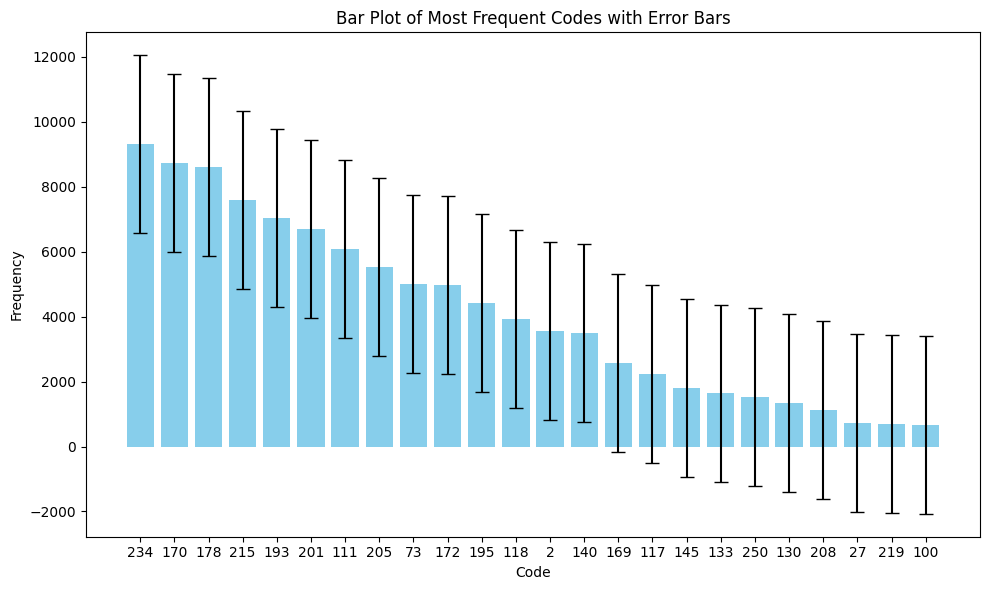

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Sample codebook data (replace with your codebook data)
codebook = list(codebook_indices.flatten())

# Calculate the frequency of each code
code_frequencies = {code: codebook.count(code) for code in set(codebook)}

# Sort codes by frequency and get the top 12
sorted_codes = [code for code, _ in sorted(code_frequencies.items(), key=lambda item: item[1], reverse=True)[:24]]

# Create a figure
fig, ax = plt.subplots(figsize=(10, 6))

# Get the frequency values and code labels
top_code_frequencies = [code_frequencies[code] for code in sorted_codes]
code_labels = [str(code) for code in sorted_codes]

# Create a bar plot with error bars (standard deviation)
ax.bar(code_labels, top_code_frequencies, yerr=np.std(top_code_frequencies), capsize=5, color='skyblue')

# Customize the plot
ax.set_xlabel('Code')
ax.set_ylabel('Frequency')
ax.set_title('Bar Plot of Most Frequent Codes with Error Bars')

# Adjust layout
plt.tight_layout()

# Save the figure as a PNG image
plt.savefig('codebook_advanced_figure.png', format='png', dpi=300)

# Show the figure
plt.show()
